# Definitions


In [ ]:
# -------------------------------
# Define ruta del proyecto
#Ruta            = "/content/drive/My Drive/Colab Notebooks/Project_BosonStar/"

# -------------------------------
#print(evokeds['Congruente'].ch_names)  # Print the available channel names
# Definitions
dpival = 100


# Import libraries

In [ ]:
# -------------------------------
# Import packages
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal


In [ ]:
# -------------------------------
# Install mne
%%capture
! pip install mne

# -------------------------------
# Import mne
import mne

# -------------------------------
# Use this to avoid replicated plots in MNE commands
#%matplotlib


In [ ]:
## -------------------------------
## Mount your google drive in google colab
#from google.colab import drive
#drive.mount('/content/drive')

## -------------------------------
## Insert the directory
#import sys
#sys.path.insert(0,Ruta)


# 1) Load data (epochs)

## Load epochs

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import scipy.io as sio

mat = sio.loadmat('/content/drive/MyDrive/P20_UTB001/P20_DataEpochs.mat')


In [ ]:

epocas = mat['epochs']
epocas.shape

(320, 1537, 16)

In [ ]:
# -------------------------------
# Info
fs           = 256
ChannelNames = ['Fp1','Fp2','F7','F3','Fz','F4','F8','C3','C4','P7','P3','Pz','P4','P8','O1','O2'] #En lugar de T5 es P7 y en lugar de T6 es P8


## Undertanding epochs

In [ ]:
# -------------------------------
# Numer of epochs for X1
NepochsX, NsamplesX, NchannelsX = epocas.shape

# -------------------------------
# Print
print('eeg.shape     ', epocas.shape) #Cambiar el orden, 320,16,1537
print('Nepochs       ', NepochsX)
print('Nchannels     ', NchannelsX)
print('Nsamples      ', NsamplesX)
print('eegmin        ', np.min(epocas) )
print('eegmax        ', np.max(epocas) )


eeg.shape      (320, 1537, 16)
Nepochs        320
Nchannels      16
Nsamples       1537
eegmin         -339.0750732421875
eegmax         904.8065185546875


In [ ]:
# -------------------------------
# # In values and units of V for EEG data
X = (1*epocas)*1e-6 #Escalar los datos a microvoltios, y convertir a V

# -------------------------------
# Print
print('X1min        ', np.min(X) )
print('X1max        ', np.max(X) )


X1min         -0.0003390750732421875
X1max         0.0009048065185546874


# 2) Construct MNE object

## Construct object

In [ ]:
# -------------------------------
# Construct a MNE data object
info          = mne.create_info( ch_names=ChannelNames, sfreq=fs, ch_types=['eeg']*NchannelsX )

info["description"] = "Demo dataset"
info.set_montage("standard_1020")


<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F7, F3, Fz, F4, F8, C3, C4, P7, P3, Pz, P4, P8, O1, O2
 chs: 16 EEG
 custom_ref_applied: False
 description: Demo dataset
 dig: 19 items (3 Cardinal, 16 EEG)
 highpass: 0.0 Hz
 lowpass: 128.0 Hz
 meas_date: unspecified
 nchan: 16
 projs: []
 sfreq: 256.0 Hz
>

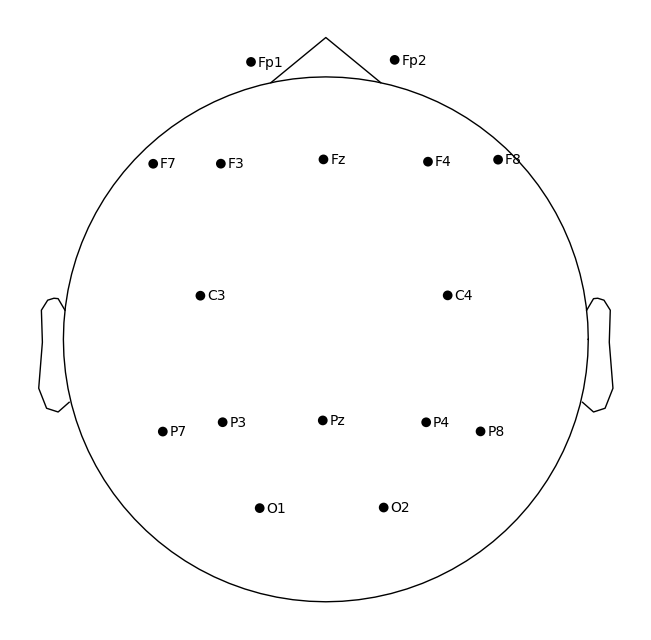

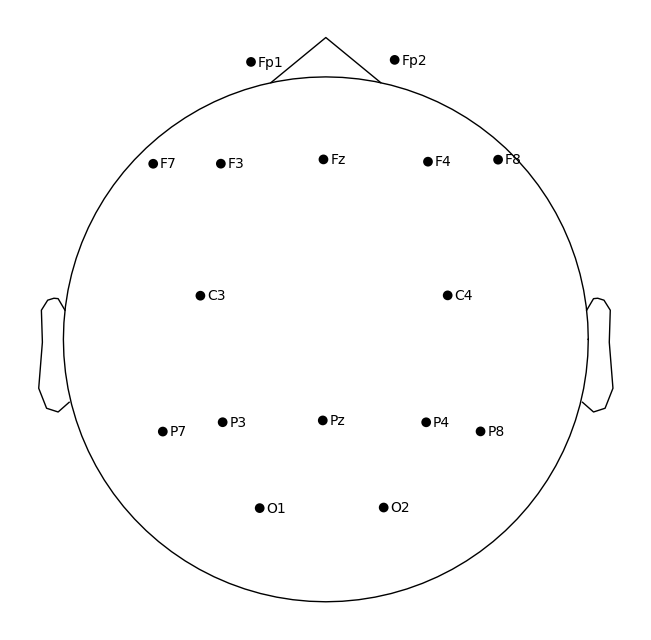

In [ ]:
# -------------------------------
# Plot topoplot with used channels
info.plot_sensors(show_names=True)


In [ ]:
# Arreglar el order de las dimensioes
X = np.transpose(X, (0, 2, 1))
X.shape


(320, 16, 1537)

In [ ]:
# Imprimir los labels existentes
np.unique(mat['epochtype'])


array([0, 1], dtype=uint8)

In [ ]:
# -------------------------------
# Construct MNE object
Nepochs, Nchannels, Nsamples = X.shape

# Define condition type of each epoch
CondType = mat['epochtype']

# Construct events
events = np.column_stack((
        np.arange(0, Nepochs)*Nsamples,
        np.zeros(Nepochs, dtype=int),
        CondType,
    ))

# Construct event_id
event_id= {"Congruent":1, "Incongruent":0}

# Construct MNE object
epochs = mne.EpochsArray( X, info, tmin=-1, events=events, event_id=event_id, verbose=False )

# Show information
epochs


<EpochsArray | 320 events (all good), -1 – 5 s (baseline off), ~60.1 MB, data loaded,
 'Congruent': 160
 'Incongruent': 160>

## Undertanding the MNE object

In [ ]:
# -------------------------------
# epochs.info
epochs.info


<Info | 9 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F7, F3, Fz, F4, F8, C3, C4, P7, P3, Pz, P4, P8, O1, O2
 chs: 16 EEG
 custom_ref_applied: False
 description: Demo dataset
 dig: 19 items (3 Cardinal, 16 EEG)
 highpass: 0.0 Hz
 lowpass: 128.0 Hz
 meas_date: unspecified
 nchan: 16
 projs: []
 sfreq: 256.0 Hz
>

In [ ]:
# -------------------------------
# Understand MNE object
print('epochs.get_data().shape  ', epochs.get_data().shape )
print('tmin                     ', epochs.tmin )
print('tmax                     ', epochs.tmax )

# Get time vector
t = epochs.times
print('t.shape:                 ',t.shape)

# Channel names
epochs.ch_names


epochs.get_data().shape   (320, 16, 1537)
tmin                      -1.0
tmax                      5.0
t.shape:                  (1537,)


['Fp1',
 'Fp2',
 'F7',
 'F3',
 'Fz',
 'F4',
 'F8',
 'C3',
 'C4',
 'P7',
 'P3',
 'Pz',
 'P4',
 'P8',
 'O1',
 'O2']

In [ ]:
# -------------------------------
# Print epochs data information
print('Shape of epochs: ',epochs.get_data().shape)

# Number of epochs, channels, samples
Nepochs   = epochs.get_data().shape[0] # Number of epochs
Nchannels = epochs.get_data().shape[1] # Number of channels
Nsamples  = epochs.get_data().shape[2] # Number of samples

# Print info
print('Nepochs:    ',Nepochs)
print('Nchannels:  ',Nchannels)
print('Nsamples:   ',Nsamples)


Shape of epochs:  (320, 16, 1537)
Nepochs:     320
Nchannels:   16
Nsamples:    1537


In [ ]:
# -------------------------------
# Get events info
epochs.event_id


{'Congruent': 1, 'Incongruent': 0}

## Plot data

Using matplotlib as 2D backend.


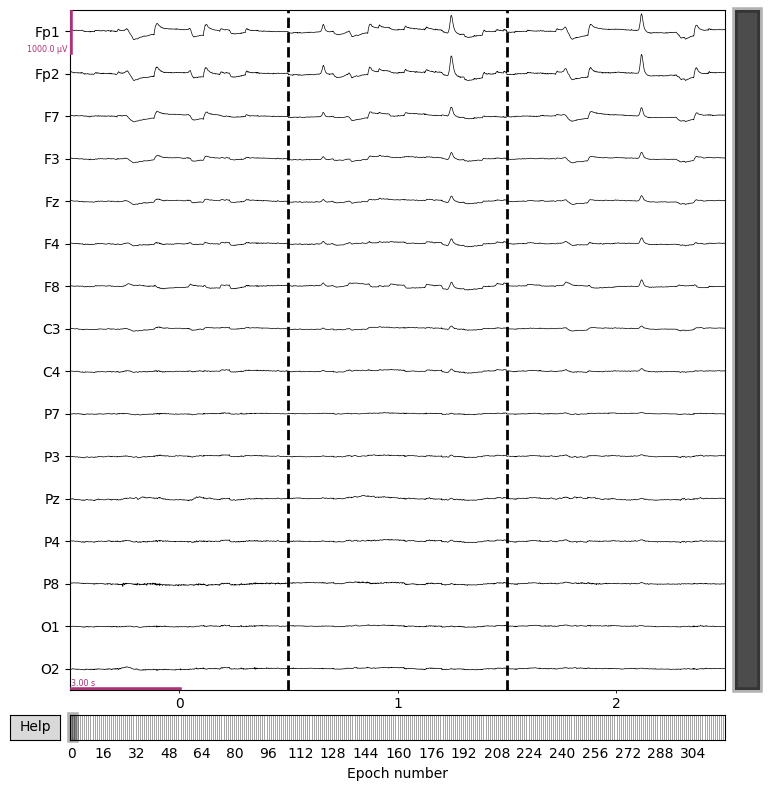

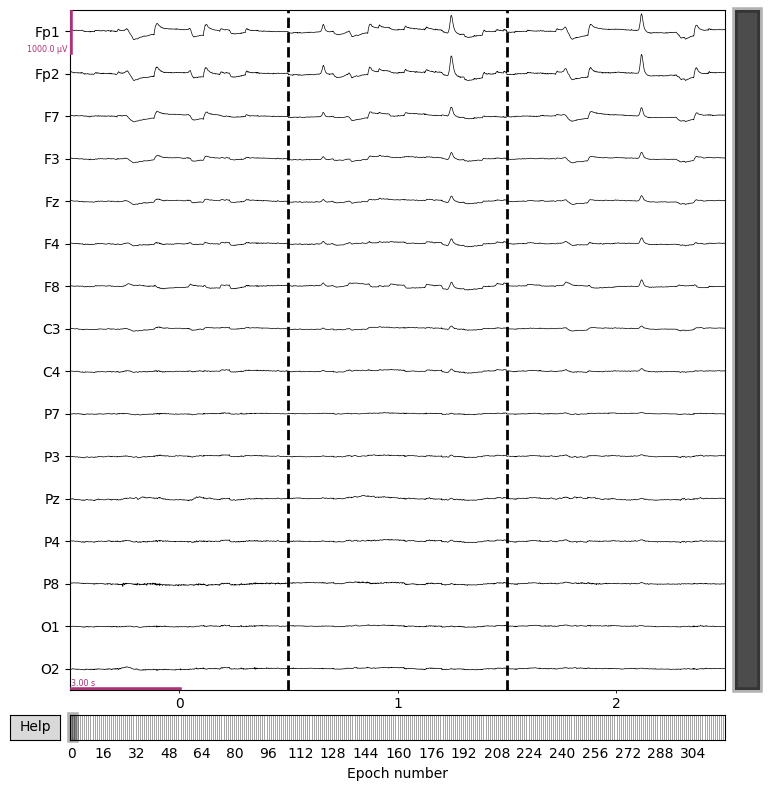

In [ ]:
# -------------------------------
# Plot some epoch
mne.viz.plot_epochs(epochs, n_epochs=3, scalings=dict(eeg=500*1e-6), show_scrollbars=True, butterfly=False, show_scalebars=True )         #Lo estaba haciendo con las 320 épocas para graficar todos los datos


# 3) Data processing

## BPF

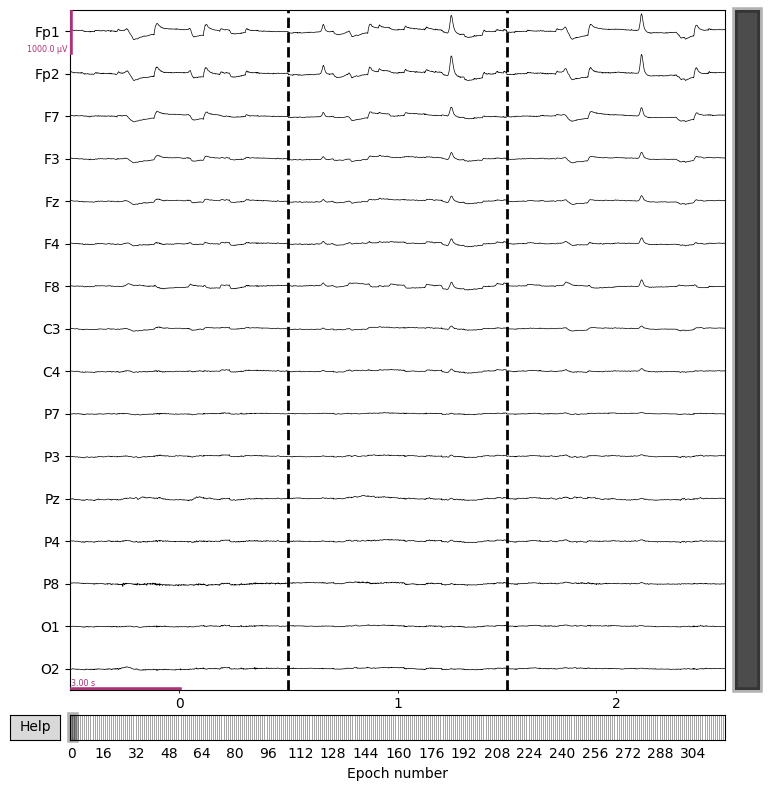

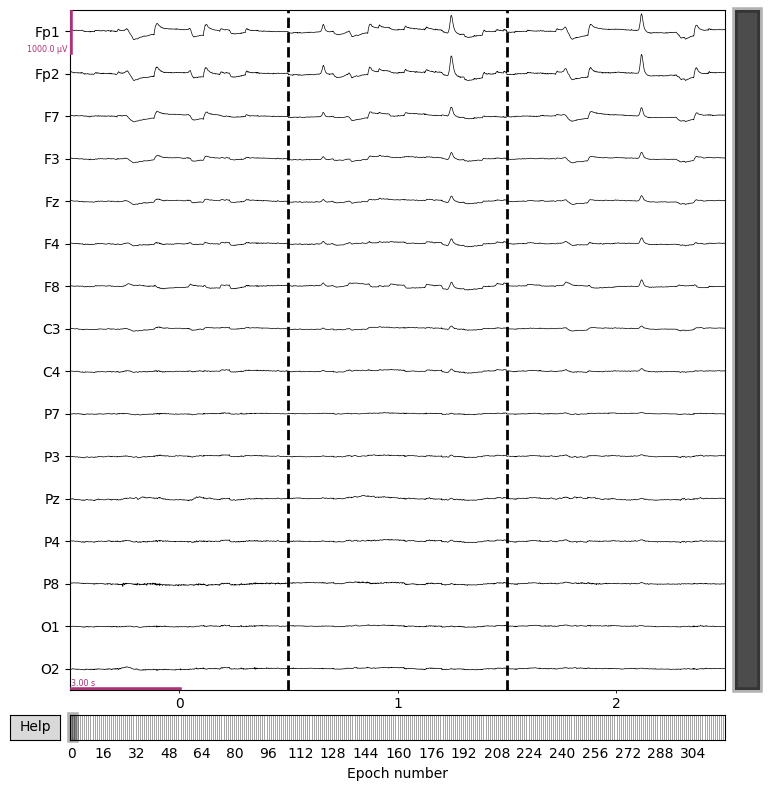

In [ ]:
# -------------------------------
# Plot data before filtering
mne.viz.plot_epochs(epochs, n_epochs=3, scalings=dict(eeg=500*1e-6), show_scrollbars=True, butterfly=False, show_scalebars=True )


In [ ]:
# Band pass filtering
epochs.filter(l_freq=4, h_freq=20, verbose=False)


<EpochsArray | 320 events (all good), -1 – 5 s (baseline off), ~60.1 MB, data loaded,
 'Congruent': 160
 'Incongruent': 160>

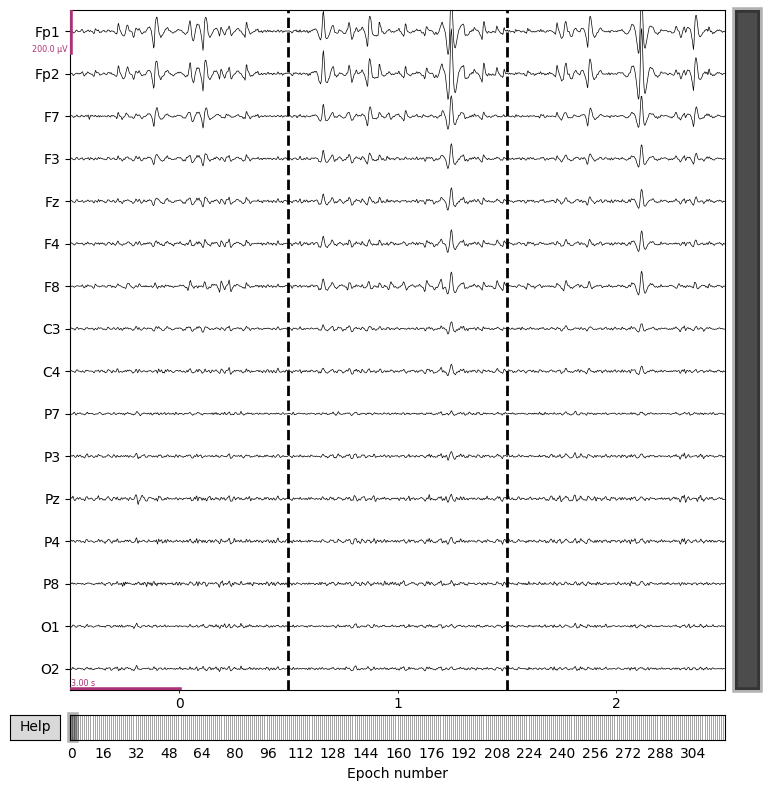

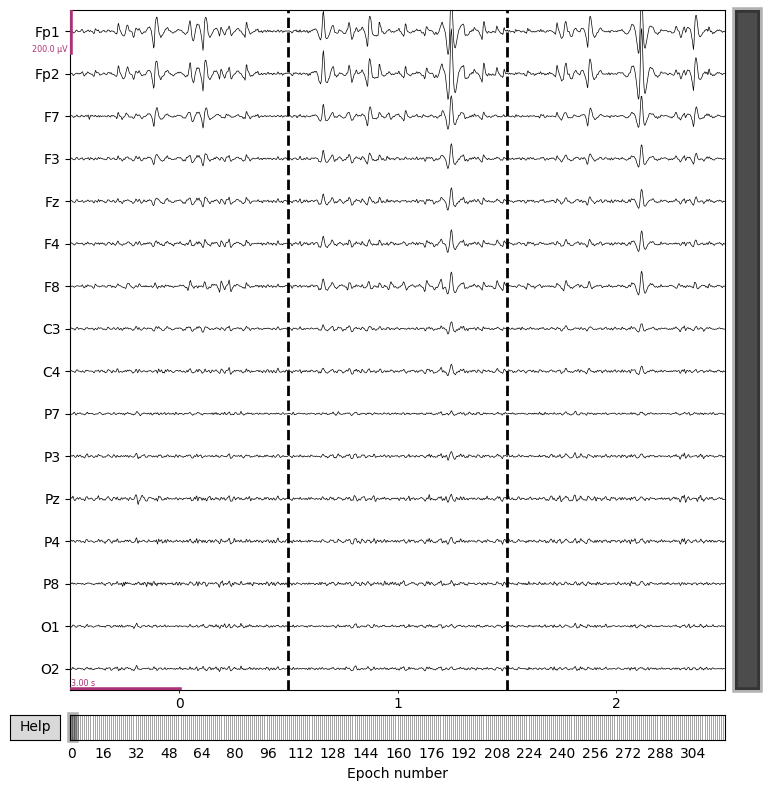

In [ ]:
# -------------------------------
# Plot data after filtering
mne.viz.plot_epochs(epochs, n_epochs=3, scalings=dict(eeg=100*1e-6), show_scrollbars=True, butterfly=False, show_scalebars=True )


## Baseline

In [ ]:
# Apply a custom baseline correction
#epochs.apply_baseline((-2.0, -0,5))


## Crop

In [ ]:
# Crop from -0.5 to +1.0s
epochs.crop(tmin=-0.5, tmax=1.0, include_tmax=True, verbose=False)


<EpochsArray | 320 events (all good), -0.5 – 1 s (baseline off), ~15.1 MB, data loaded,
 'Congruent': 160
 'Incongruent': 160>

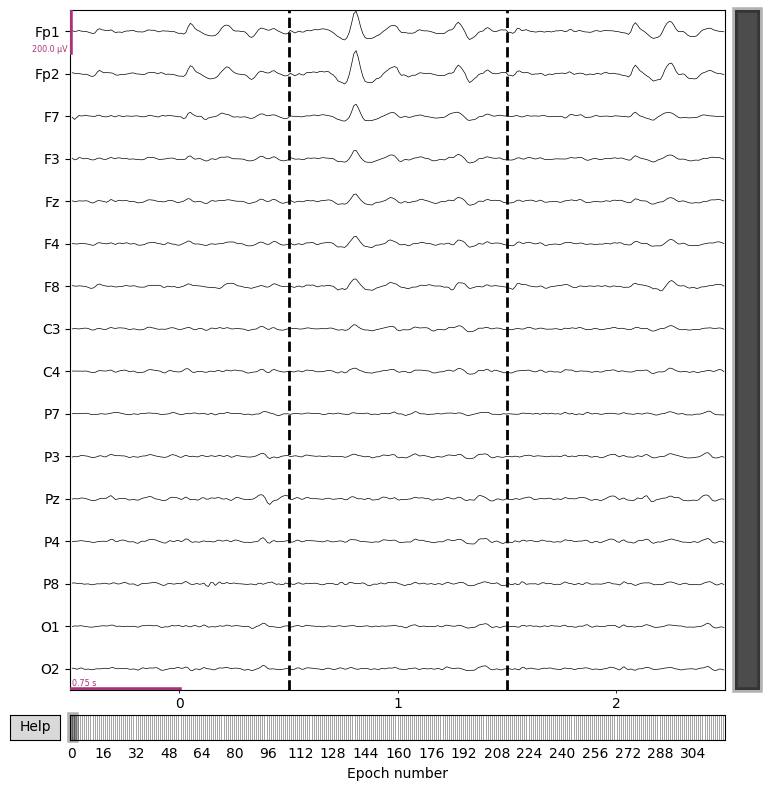

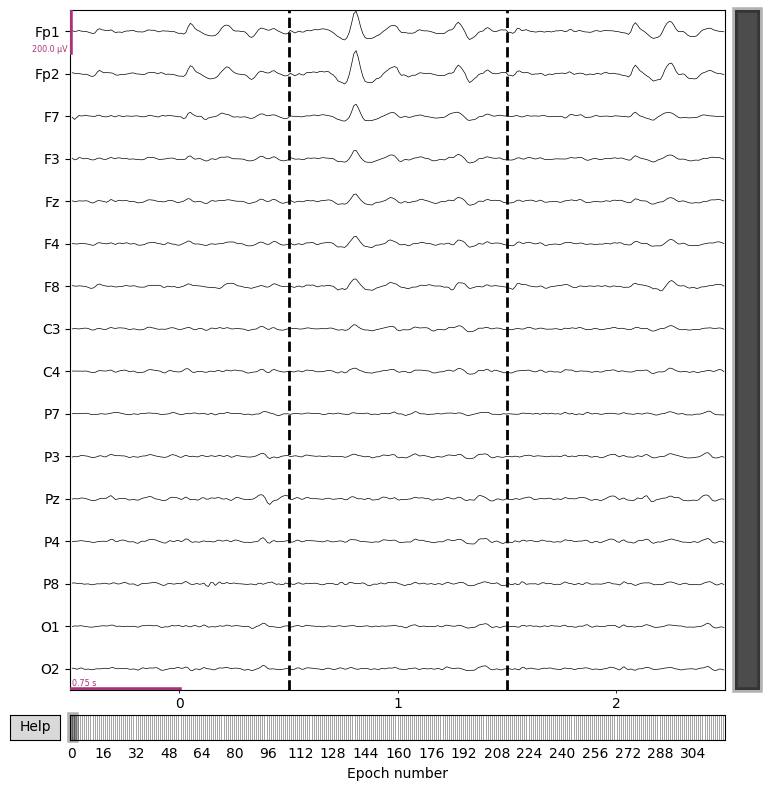

In [ ]:
# -------------------------------
# Plot data after filtering
mne.viz.plot_epochs(epochs, n_epochs=3, scalings=dict(eeg=100*1e-6), show_scrollbars=True, butterfly=False, show_scalebars=True )


## Remove noisy channels

In [ ]:
# Remove noisy channels
#channels2drop = ['T6','T5','O2','O1','Fp1','Fp2']
channels2drop = []

epochs2 = epochs.copy()
epochs2.drop_channels(channels2drop)


<EpochsArray | 320 events (all good), -0.5 – 1 s (baseline off), ~15.1 MB, data loaded,
 'Congruent': 160
 'Incongruent': 160>

## Reject noisy epochs

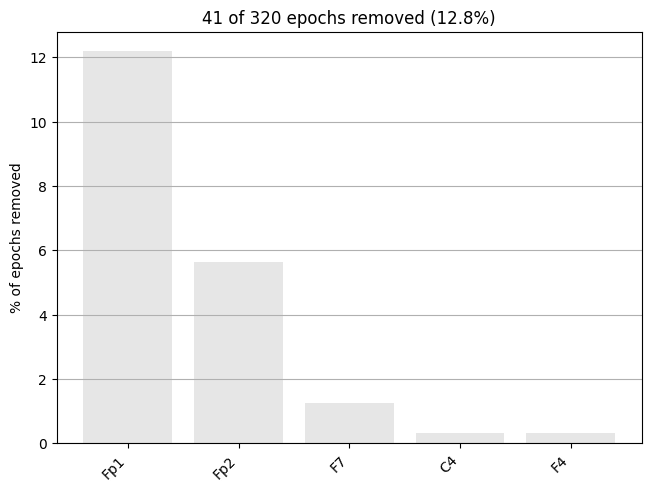

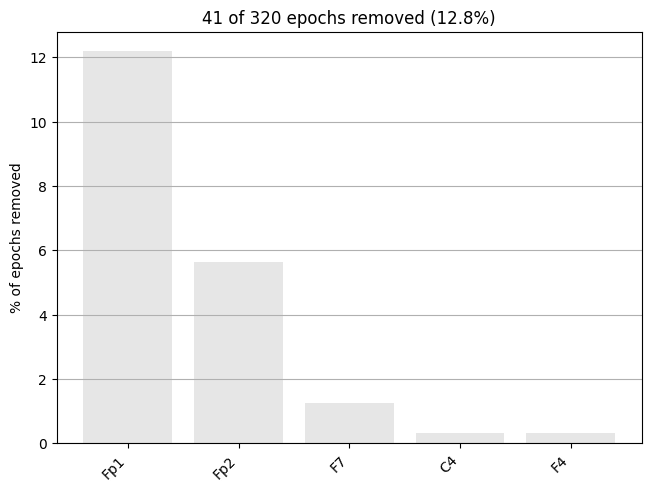

In [ ]:
# Reject noisy epochs
reject_criteria = dict(eeg=150*1e-6)  # 150 µV
epochs3 = epochs2.drop_bad(reject=reject_criteria, verbose=False)

# Percentage of removed epochs per channel
epochs3.plot_drop_log()


In [ ]:
epochs3

<EpochsArray | 279 events (all good), -0.5 – 1 s (baseline off), ~13.1 MB, data loaded,
 'Congruent': 129
 'Incongruent': 150>

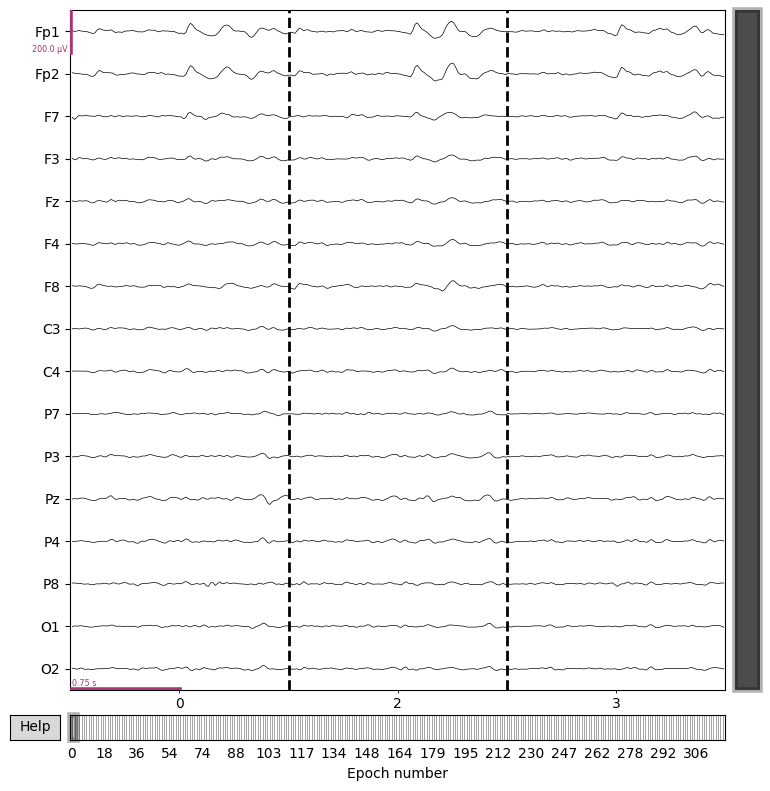

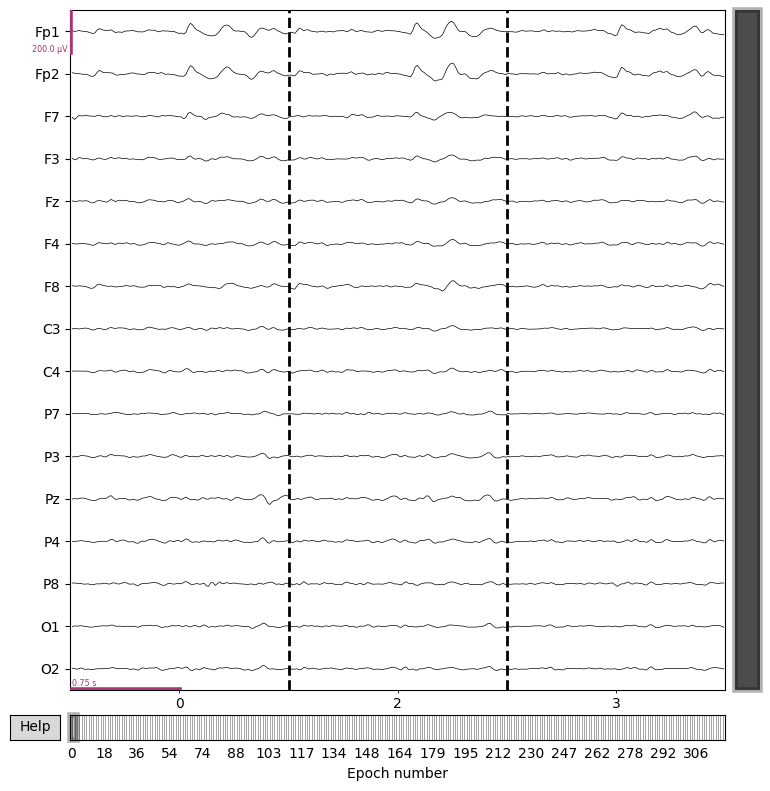

In [ ]:
# -------------------------------
# Plot data after filtering
mne.viz.plot_epochs(epochs3, n_epochs=3, scalings=dict(eeg=100*1e-6), show_scrollbars=True, butterfly=False, show_scalebars=True )


## Set CAR

In [ ]:
# Set common average reference
#raw.set_eeg_reference("average", projection=False, verbose=False)


## XDAWN Denoising

In [ ]:
# XDAWN Denoising


## Get epochs = epochs3.copy()

In [ ]:
# Recupero la variable epochs
epochs = epochs3.copy()


# 4) Event Related Potentials (ERP)

## All epochs

In [ ]:
# -------------------------------
# Compute average of each channel
epochs_avg = epochs.average()


In [ ]:
# -------------------------------
# Print avg data information
print('Shape of avg:   ',epochs_avg.data.shape)

# Number of channels
Nchannels = epochs_avg.data.shape[0]
print('Nchannels:      ',Nchannels)

# Number of samples
Nsamples = epochs_avg.data.shape[1]
print('Nchannels:      ',Nsamples)

# Time vector
print('avg.timw.shape: ',epochs_avg.times.shape)


Shape of avg:    (16, 385)
Nchannels:       16
Nchannels:       385
avg.timw.shape:  (385,)


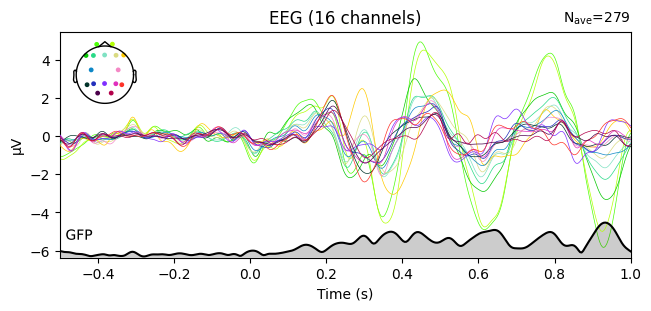

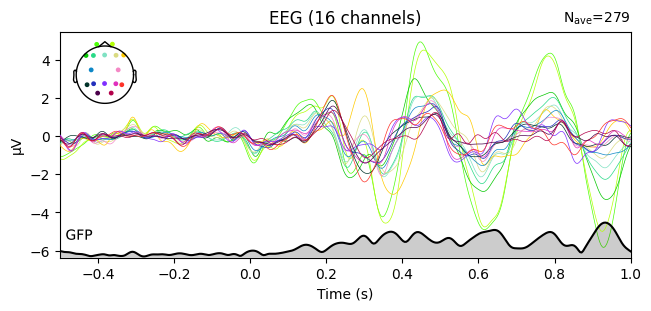

In [ ]:
# -------------------------------
# Plot the average of all channels
epochs_avg.plot( spatial_colors=True, gfp=True )


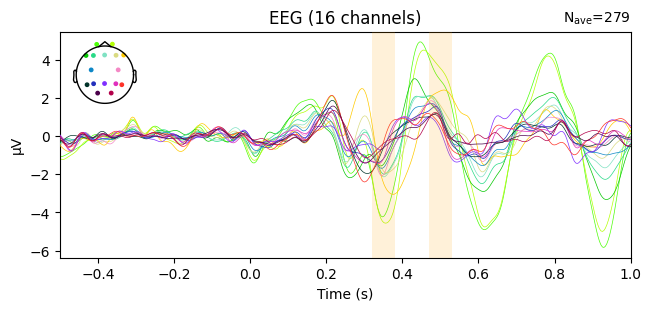

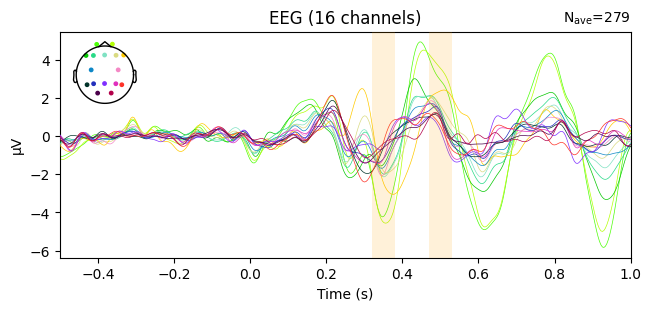

In [ ]:
# -------------------------------
# Plot average and highlight time ranges of interest
time_ranges_of_interest = [(0.32, 0.38), (0.47, 0.53)]
epochs_avg.plot(picks="eeg", spatial_colors=True, gfp=False, highlight=time_ranges_of_interest)


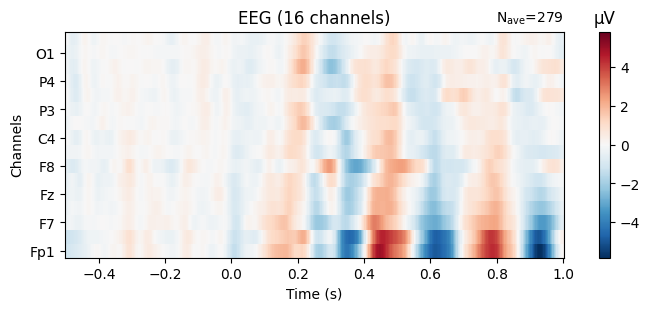

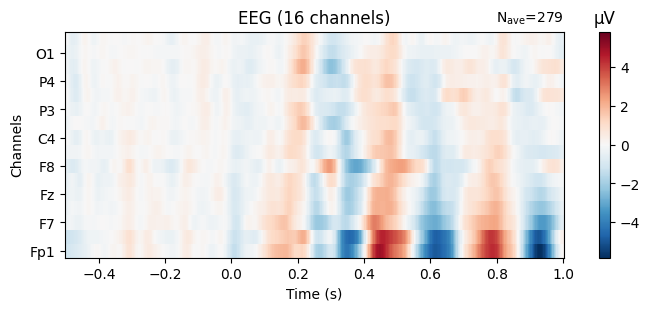

In [ ]:
# -------------------------------
#Image plots
epochs_avg.plot_image(show_names=True)


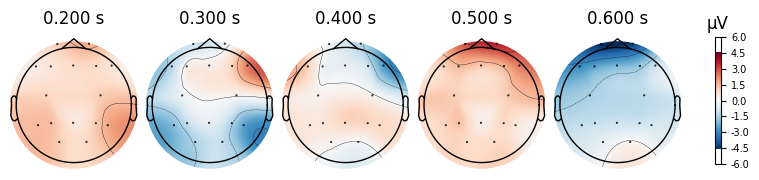

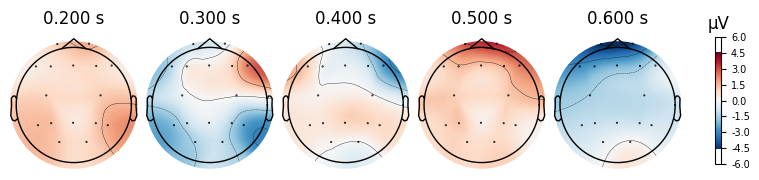

In [ ]:
# -------------------------------
# Plot scalp topographies
times2topoplot = np.array( [0.2, 0.3, 0.4, 0.5, 0.6] )
epochs_avg.plot_topomap(ch_type="eeg", times=times2topoplot, colorbar=True)


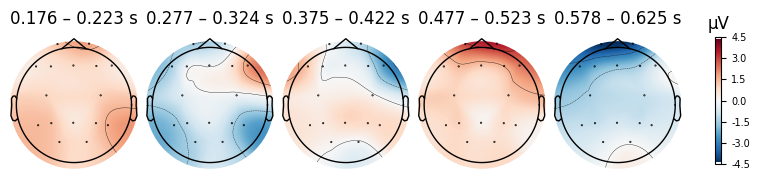

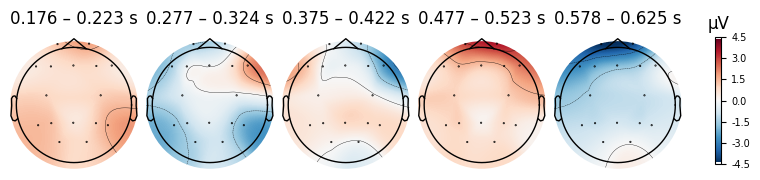

In [ ]:
# -------------------------------
# Plot scalp topographies
times2topoplot = np.array( [0.2, 0.3, 0.4, 0.5, 0.6] )
epochs_avg.plot_topomap(ch_type="eeg", times=times2topoplot, average=0.05, colorbar=True)


No projector specified for this dataset. Please consider the method self.add_proj.


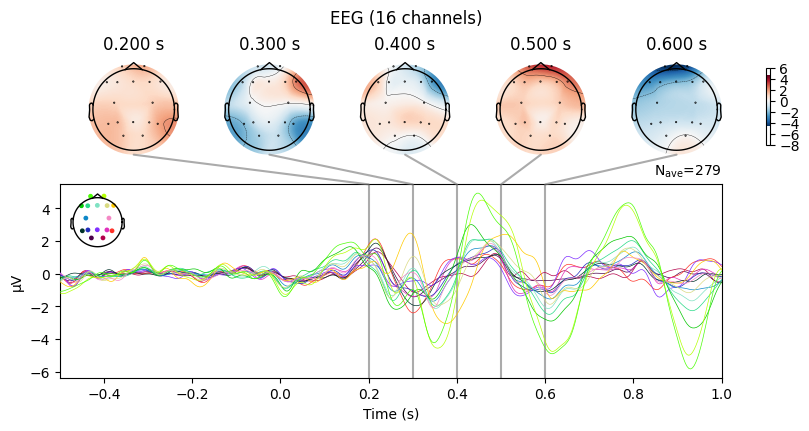

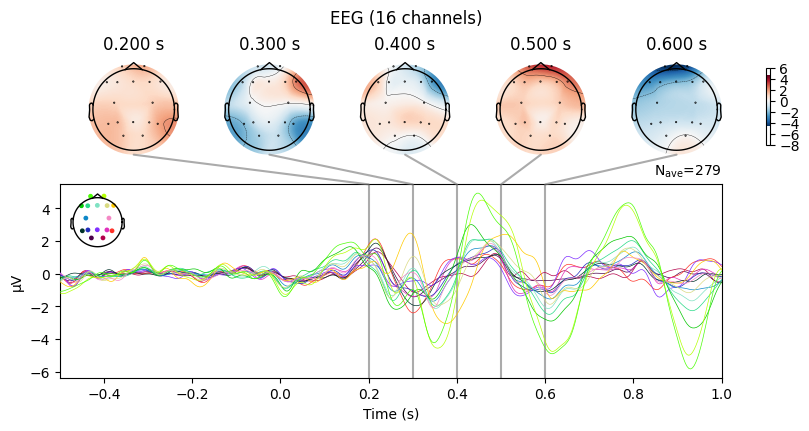

In [ ]:
# -------------------------------
# Plot scalp topographies
epochs_avg.plot_joint(times2topoplot)


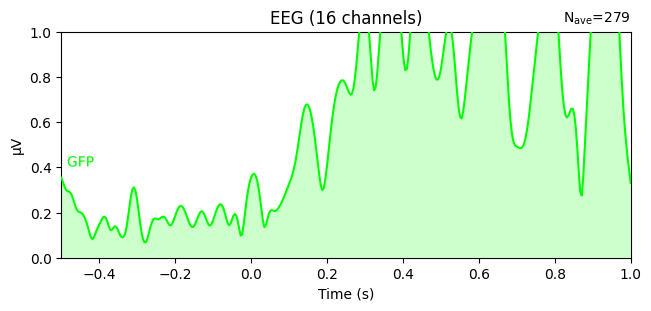

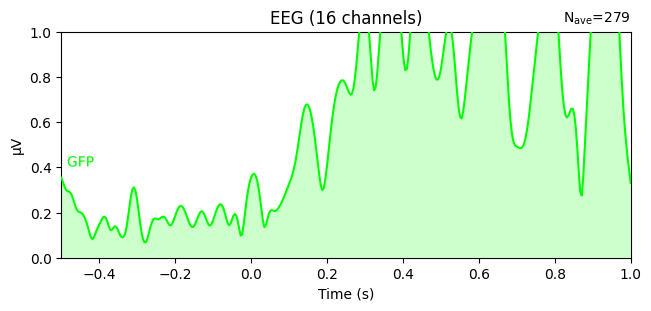

In [ ]:
# -------------------------------
# Plot the GFP
epochs_avg.plot(gfp="only")


## Epochs Congruent

In [ ]:
# -------------------------------
# Get epochs from the "Congruent" condition
epochscond1 = epochs["Congruent"]


In [ ]:
# -------------------------------
# Compute average of each channel
epochscond1_avg = epochscond1.average( )


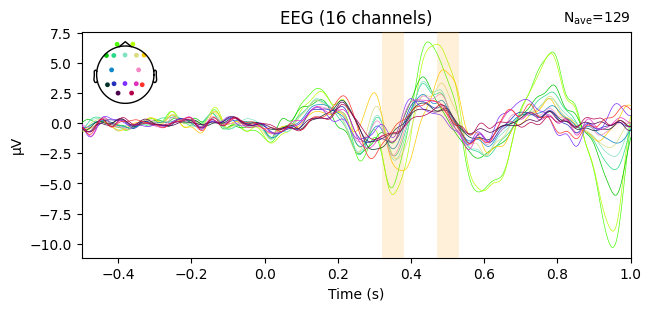

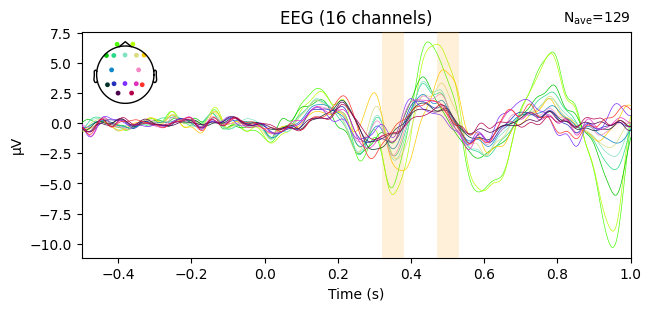

In [ ]:
# -------------------------------
# Plot average and highlight time ranges of interest
time_ranges_of_interest = [(0.32, 0.38), (0.47, 0.53)]
epochscond1_avg.plot(picks="eeg", spatial_colors=True, gfp=False, highlight=time_ranges_of_interest)


## Epochs Incongruent

In [ ]:
# -------------------------------
# Get epochs from the "Incongruent" condition
epochscond2 = epochs["Incongruent"]


In [ ]:
# -------------------------------
# Compute average of each channel
epochscond2_avg = epochscond2.average( )


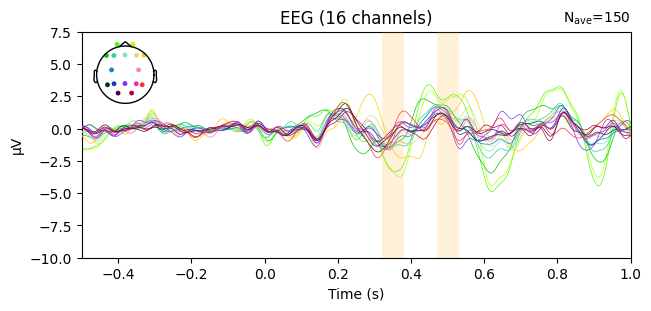

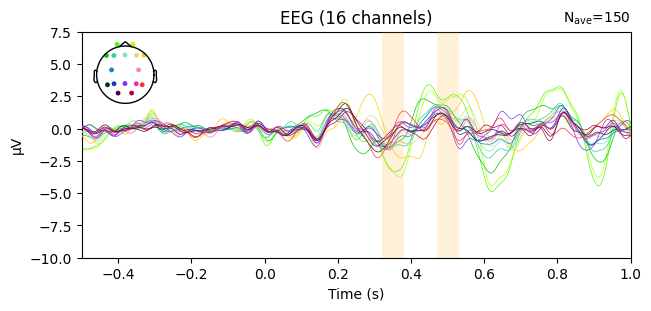

In [ ]:
# -------------------------------
# -------------------------------
# Plot average and highlight time ranges of interest
time_ranges_of_interest = [(0.32, 0.38), (0.47, 0.53)]
epochscond2_avg.plot(picks="eeg", spatial_colors=True, gfp=False, highlight=time_ranges_of_interest,ylim=dict(eeg=[-10, 7.5]))

## Compare conditions

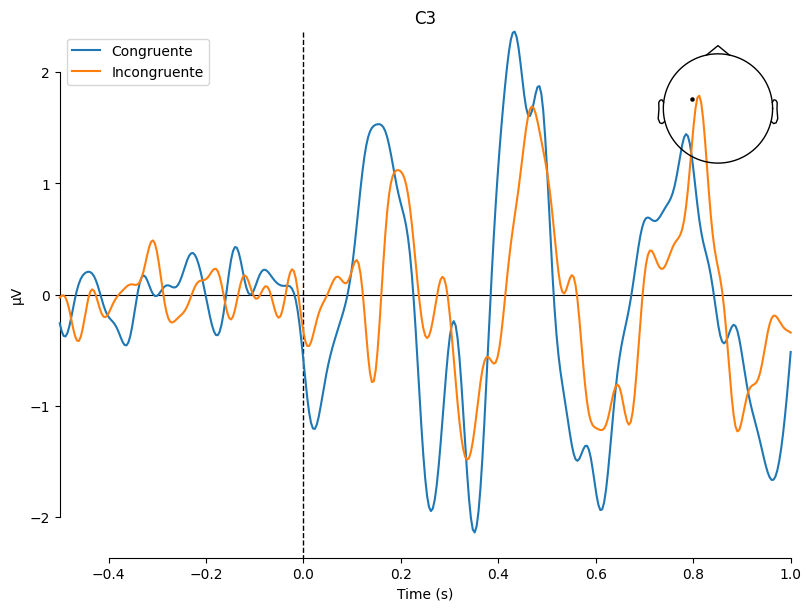

[<Figure size 800x600 with 2 Axes>]

In [ ]:

cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picks = ['C3']
mne.viz.plot_compare_evokeds(evokeds, picks=picks)


More than 6 channels, truncating title ...
combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


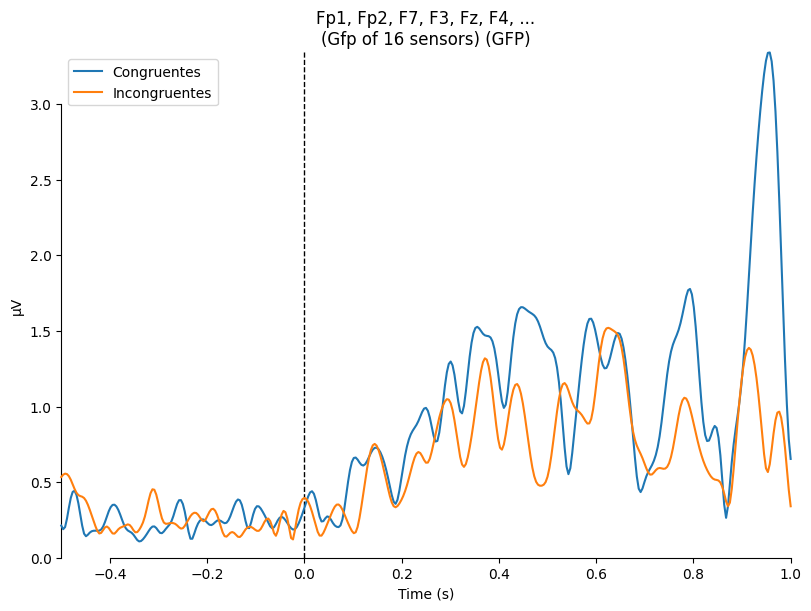

[<Figure size 800x600 with 1 Axes>]

In [ ]:
evokeds = dict(Congruentes=epochscond1_avg, Incongruentes=epochscond2_avg)
picks = ['Fp1','Fp2','F7','F3','Fz','F4','F8','C3','C4','P7','P3','Pz','P4','P8','O1','O2']
mne.viz.plot_compare_evokeds(evokeds, picks=picks)

More than 6 channels, truncating title ...
combining channels using "mean"
combining channels using "mean"


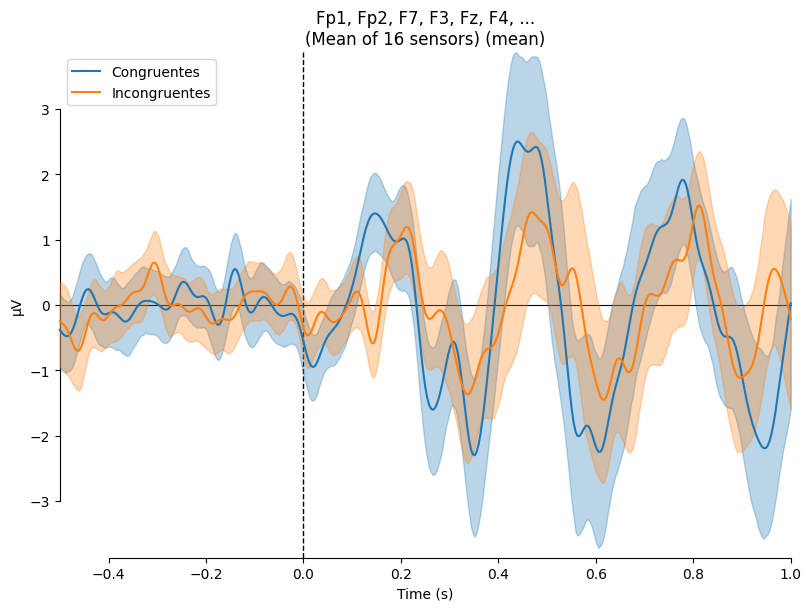

[<Figure size 800x600 with 1 Axes>]

In [ ]:
evokedsIter = dict(
    Congruentes=list(epochscond1.iter_evoked()),
    Incongruentes=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picks)

No projector specified for this dataset. Please consider the method self.add_proj.


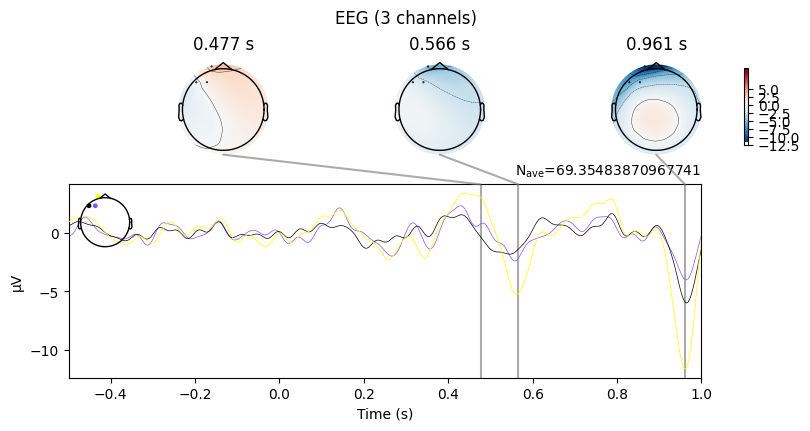

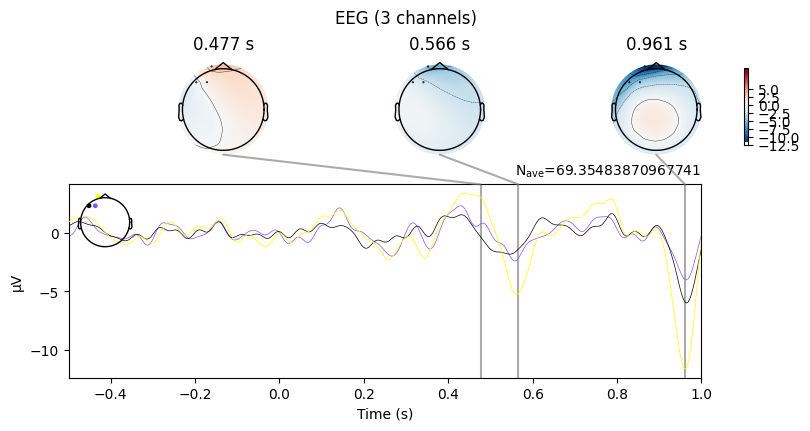

In [ ]:
aud_minus_vis = mne.combine_evoked([epochscond1_avg, epochscond2_avg], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparación condiciones zona FI

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


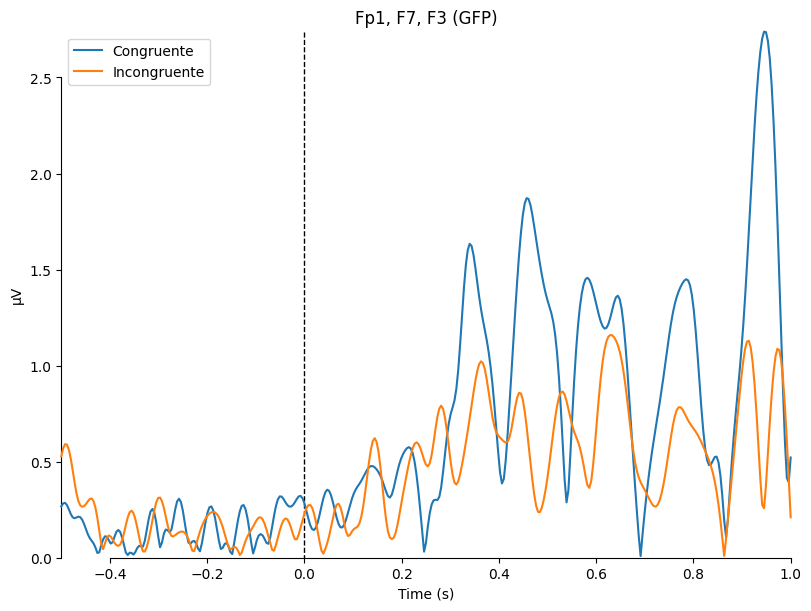

[<Figure size 800x600 with 1 Axes>]

In [ ]:

cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picksFI = ['Fp1','F7','F3']
mne.viz.plot_compare_evokeds(evokeds, picks=picksFI)

combining channels using "mean"
combining channels using "mean"


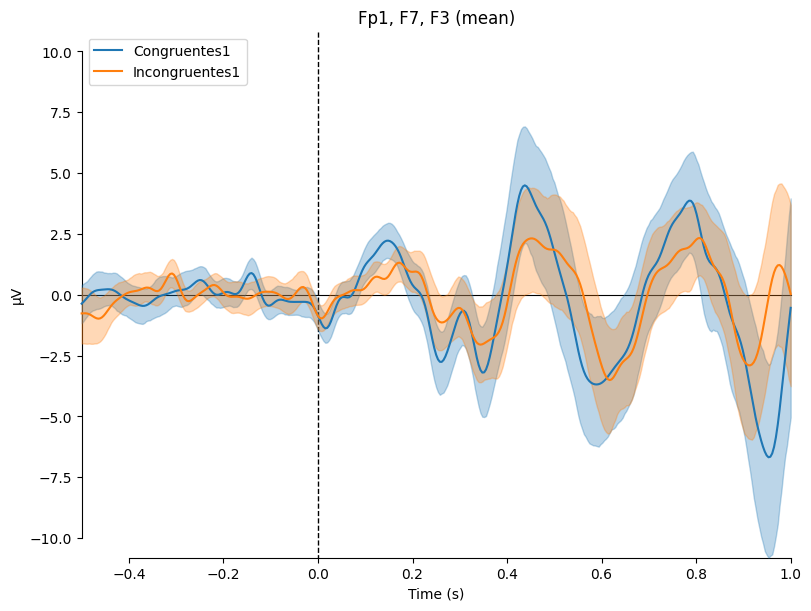

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes1=list(epochscond1.iter_evoked()),
    Incongruentes1=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksFI)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


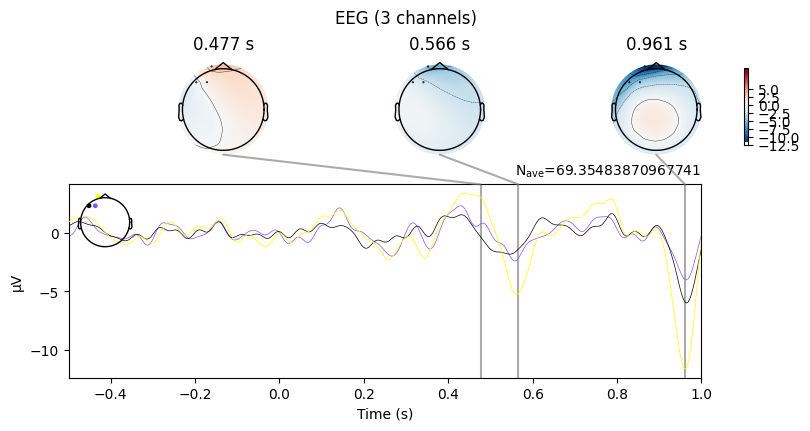

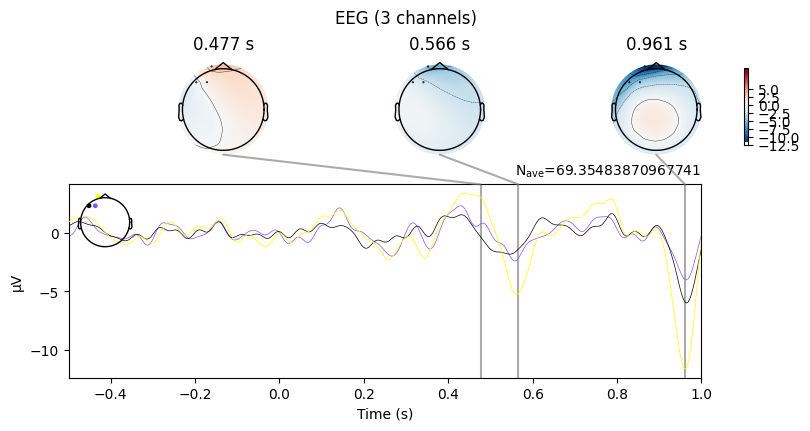

In [ ]:
### Resta de canales
epochscond1_picks = epochscond1_avg.pick_channels(['Fp1','F7','F3'])
epochscond2_picks = epochscond2_avg.pick_channels(['Fp1','F7','F3'])

aud_minus_vis = mne.combine_evoked([epochscond1_picks, epochscond2_picks], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparaci+on condiciones zona FI con FZ

MUY IMPORTANTE: Tenemos que resetear de nuevo las variables de debido a que la gráfica de la resta me elimina el resto de canales

In [ ]:
epochscond1 = epochs["Congruent"]
epochscond1_avg = epochscond1.average( )

epochscond2 = epochs["Incongruent"]
epochscond2_avg = epochscond2.average( )

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


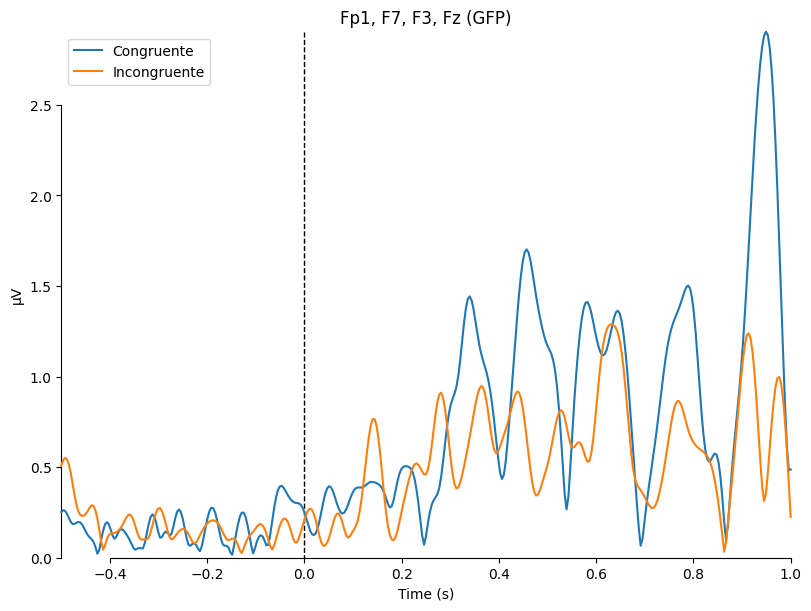

[<Figure size 800x600 with 1 Axes>]

In [ ]:
cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picksFI2 = ['Fp1','F7','F3','Fz']
mne.viz.plot_compare_evokeds(evokeds, picks=picksFI2)

combining channels using "mean"
combining channels using "mean"


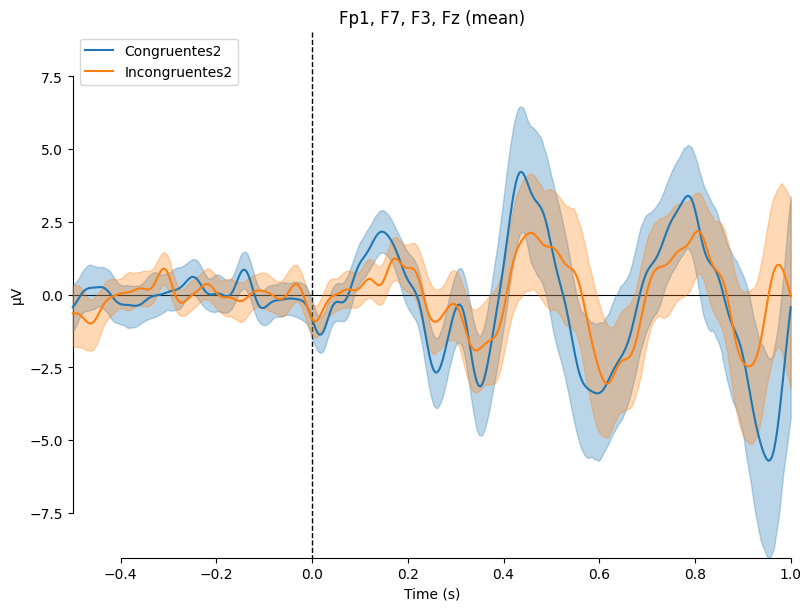

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes2=list(epochscond1.iter_evoked()),
    Incongruentes2=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksFI2)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


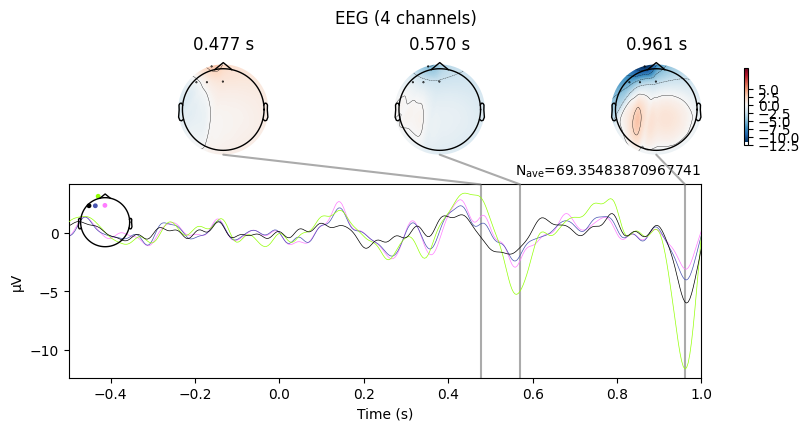

['Fp1', 'F7', 'F3', 'Fz']


In [ ]:
### Resta de canales
epochscond1_picks = epochscond1_avg.pick_channels(['Fp1','F7','F3','Fz'])
epochscond2_picks = epochscond2_avg.pick_channels(['Fp1','F7','F3','Fz'])

aud_minus_vis = mne.combine_evoked([epochscond1_picks, epochscond2_picks], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparación condiciones FI con C3

A mi parecer hacer comparaciones con el punto C3 es muy interesante puesto que nos brinda información de la respuesta somatosensorial del participante


In [ ]:
#De nuevo las reseteamos

epochscond1 = epochs["Congruent"]
epochscond1_avg = epochscond1.average( )

epochscond2 = epochs["Incongruent"]
epochscond2_avg = epochscond2.average( )

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


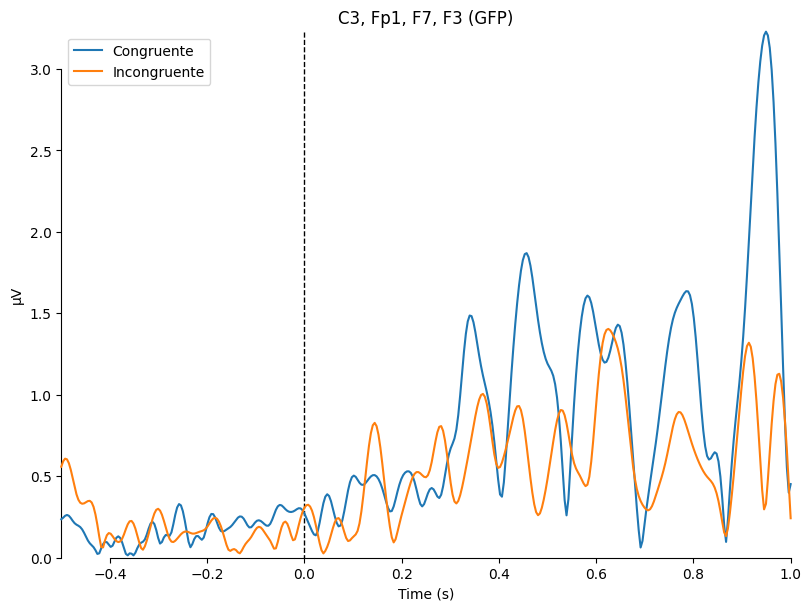

[<Figure size 800x600 with 1 Axes>]

In [ ]:
cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picksFI3 = ['C3','Fp1','F7','F3']
mne.viz.plot_compare_evokeds(evokeds, picks=picksFI3)

combining channels using "mean"
combining channels using "mean"


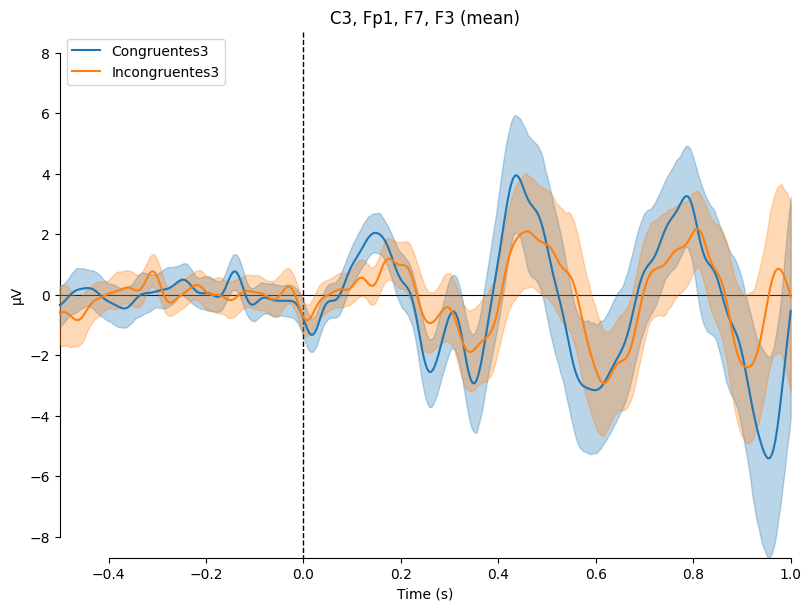

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes3=list(epochscond1.iter_evoked()),
    Incongruentes3=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksFI3)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


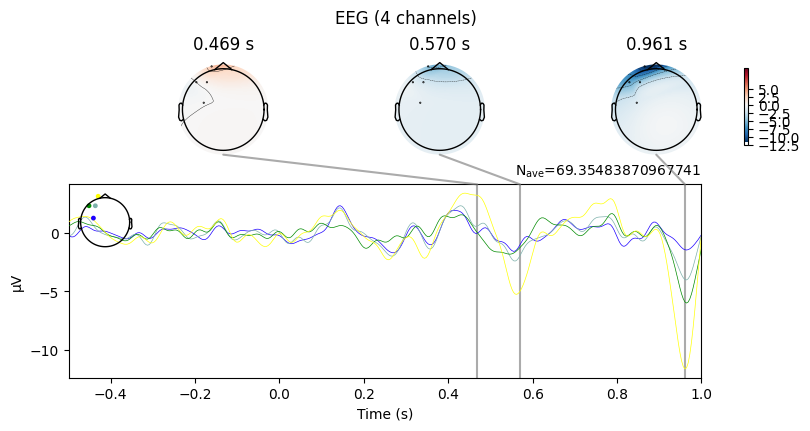

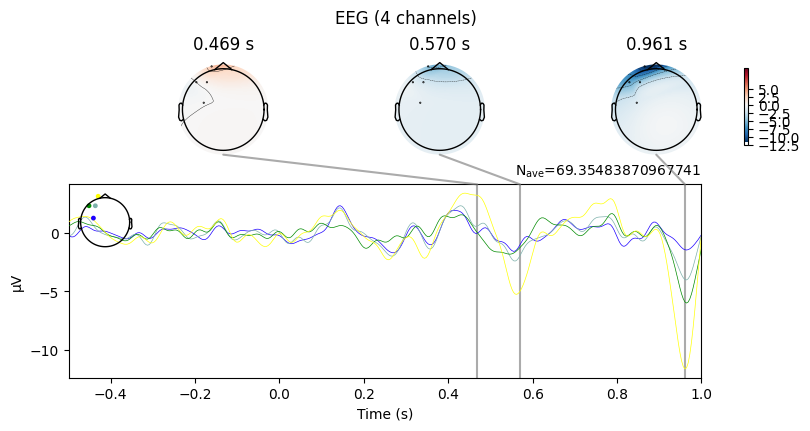

In [ ]:
### Resta de canales
epochscond1_picks = epochscond1_avg.pick_channels(['C3','Fp1','F7','F3'])
epochscond2_picks = epochscond2_avg.pick_channels(['C3','Fp1','F7','F3'])

aud_minus_vis = mne.combine_evoked([epochscond1_picks, epochscond2_picks], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparación condiciones zona FD

In [ ]:
#Volvemos a resetar

epochscond1 = epochs["Congruent"]
epochscond1_avg = epochscond1.average( )

epochscond2 = epochs["Incongruent"]
epochscond2_avg = epochscond2.average( )

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


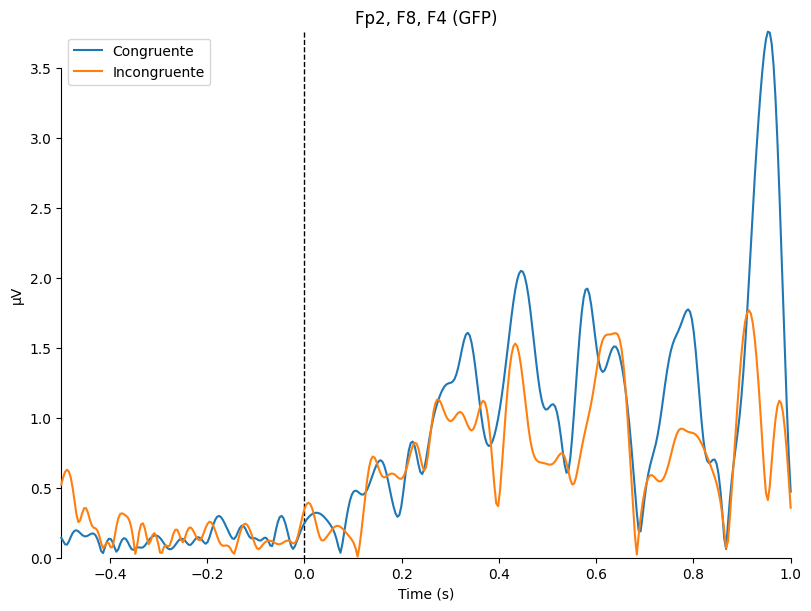

[<Figure size 800x600 with 1 Axes>]

In [ ]:

cong = epochscond1_avg
incong = epochscond2_avg
evokeds2 = dict(Congruente=cong, Incongruente=incong)
#print(evokeds2['Congruente'].ch_names)
picksFD = ['Fp2','F8','F4']
mne.viz.plot_compare_evokeds(evokeds, picks=picksFD)

combining channels using "mean"
combining channels using "mean"


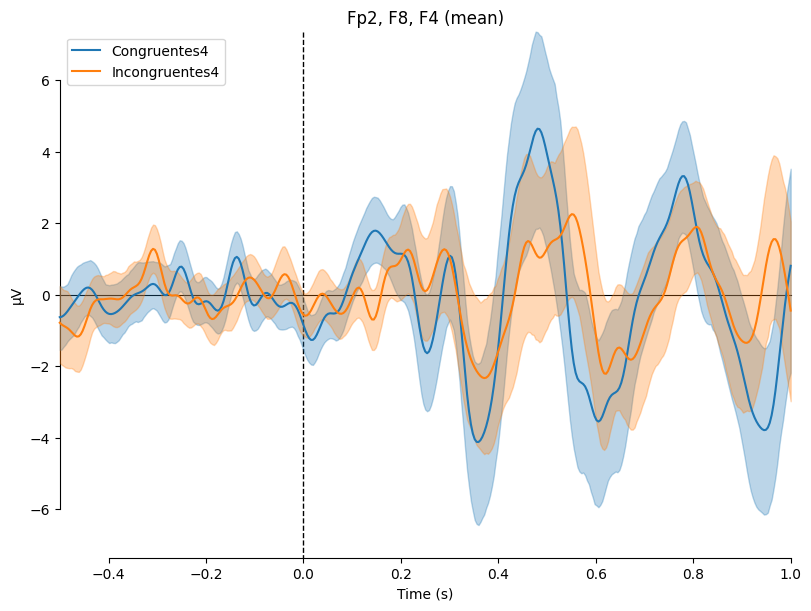

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes4=list(epochscond1.iter_evoked()),
    Incongruentes4=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksFD)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


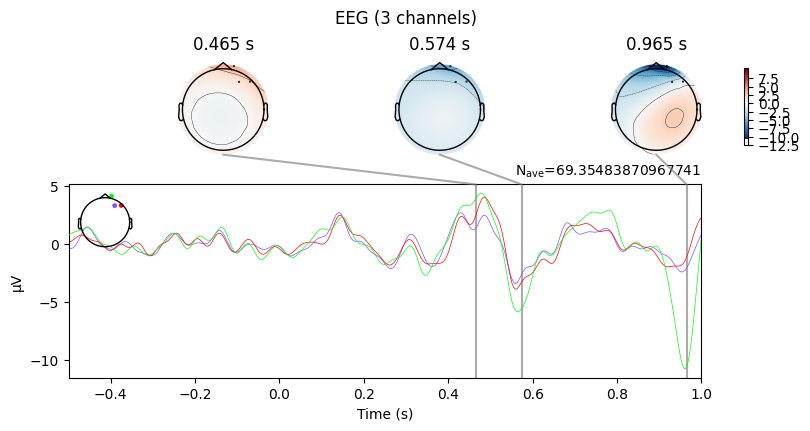

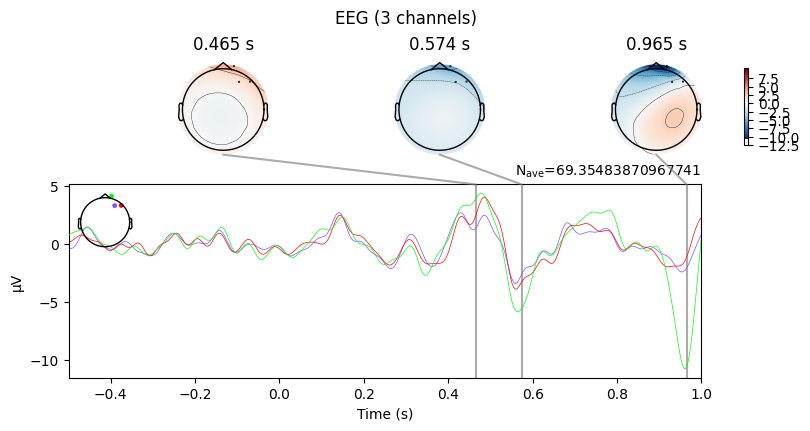

In [ ]:
### Resta de canales
epochscond1_picks = epochscond1_avg.pick_channels(['Fp2','F8','F4'])
epochscond2_picks = epochscond2_avg.pick_channels(['Fp2','F8','F4'])

aud_minus_vis = mne.combine_evoked([epochscond1_avg, epochscond2_avg], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparación condiciones zona FD con FZ

In [ ]:
#Reseteamos de nuevo

epochscond1 = epochs["Congruent"]
epochscond1_avg = epochscond1.average( )

epochscond2 = epochs["Incongruent"]
epochscond2_avg = epochscond2.average( )

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


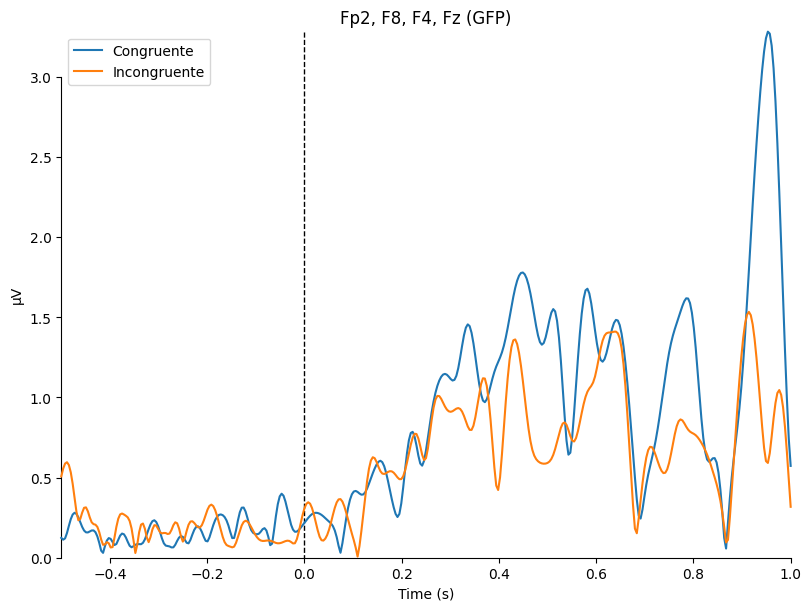

[<Figure size 800x600 with 1 Axes>]

In [ ]:

cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picksFD = ['Fp2','F8','F4','Fz']
mne.viz.plot_compare_evokeds(evokeds, picks=picksFD)

combining channels using "mean"
combining channels using "mean"


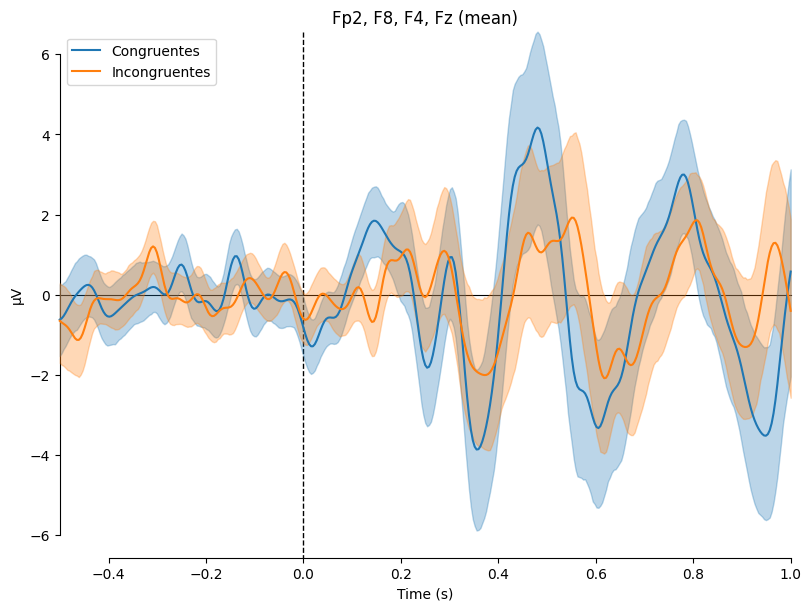

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes=list(epochscond1.iter_evoked()),
    Incongruentes=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksFD)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


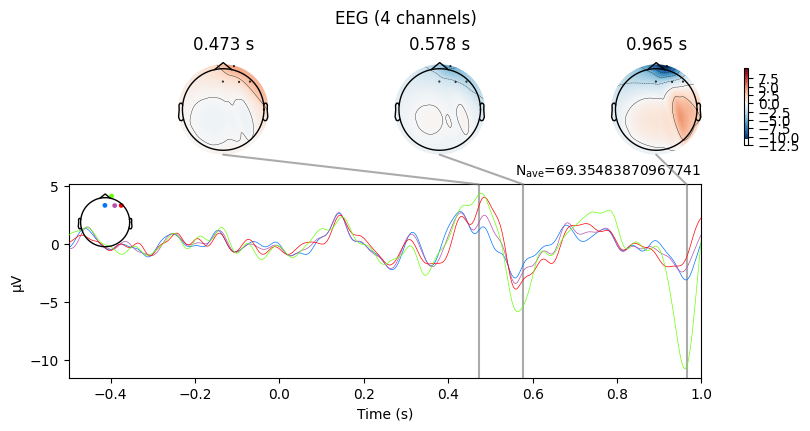

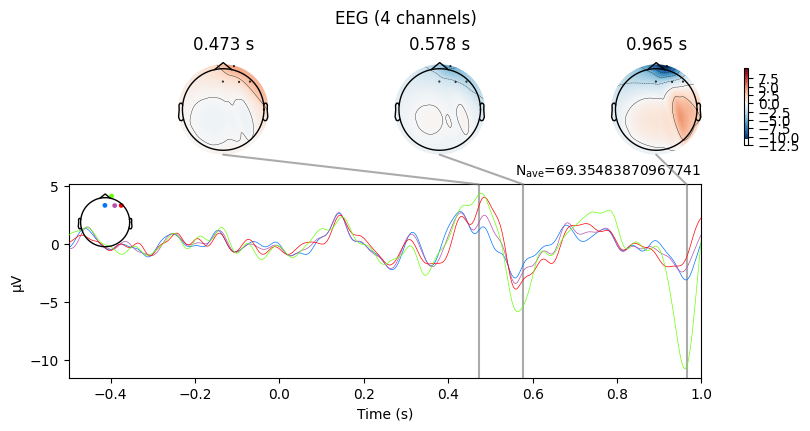

In [ ]:
### Resta de canales
epochscond1_picks = epochscond1_avg.pick_channels(['Fp2','F8','F4','Fz'])
epochscond2_picks = epochscond2_avg.pick_channels(['Fp2','F8','F4','Fz'])

aud_minus_vis = mne.combine_evoked([epochscond1_avg, epochscond2_avg], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparación condiciones FD con C4

In [ ]:
#Se resetean otra vez

epochscond1 = epochs["Congruent"]
epochscond1_avg = epochscond1.average( )

epochscond2 = epochs["Incongruent"]
epochscond2_avg = epochscond2.average( )

More than 6 channels, truncating title ...
combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


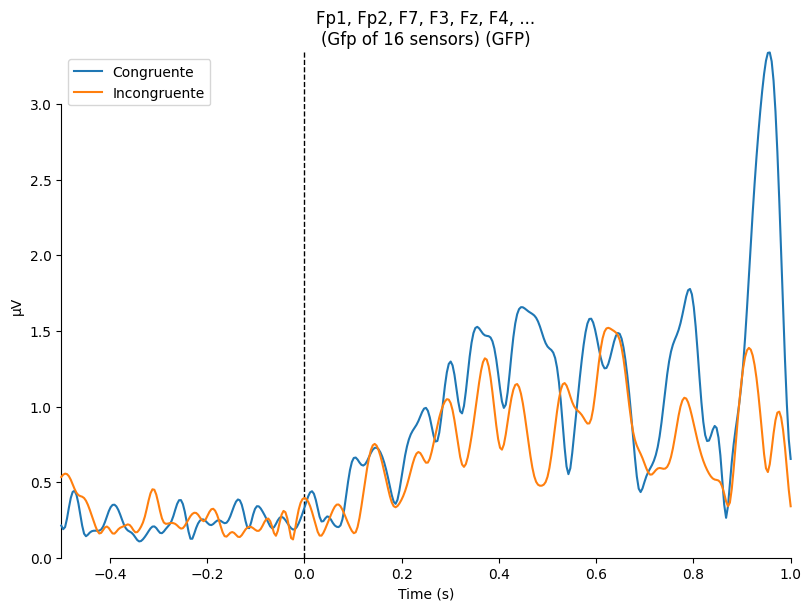

[<Figure size 800x600 with 1 Axes>]

In [ ]:
cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picksFD = ['Fp2','F8','F4','C4']
mne.viz.plot_compare_evokeds(evokeds, picks=picks)

combining channels using "mean"
combining channels using "mean"


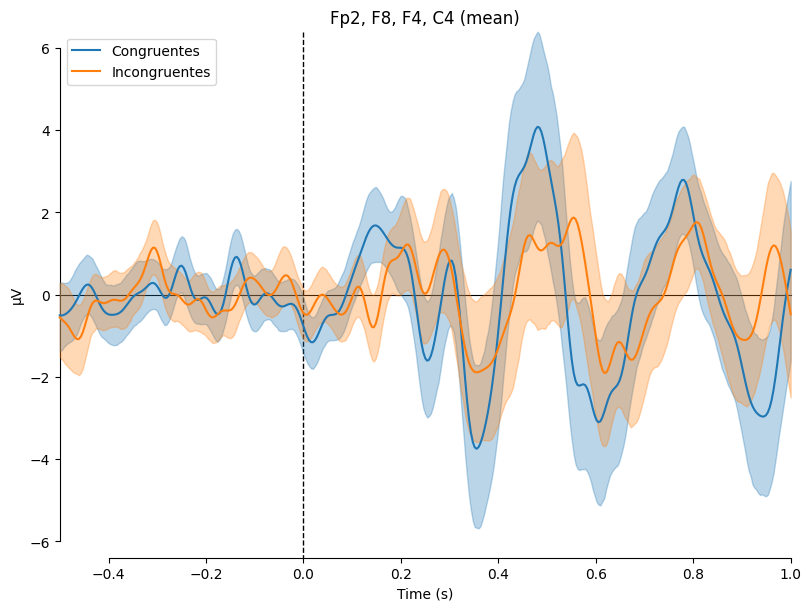

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes=list(epochscond1.iter_evoked()),
    Incongruentes=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksFD)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


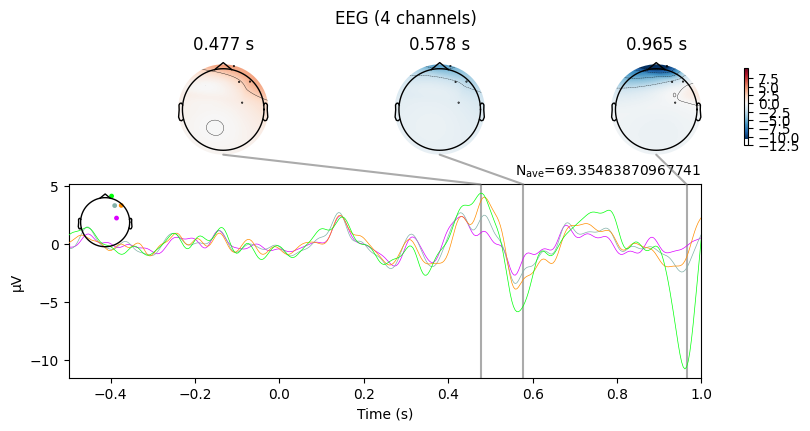

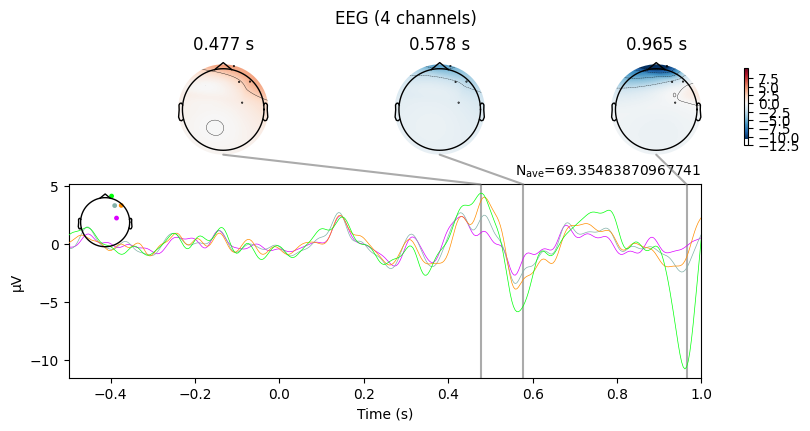

In [ ]:
### Resta de canales
epochscond1_picks = epochscond1_avg.pick_channels(['Fp2','F8','F4','C4'])
epochscond2_picks = epochscond2_avg.pick_channels(['Fp2','F8','F4','C4'])

aud_minus_vis = mne.combine_evoked([epochscond1_avg, epochscond2_avg], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparación condiciones zona Occipital I (Occipucio)

In [ ]:
#Reseteamos de nuevo

epochscond1 = epochs["Congruent"]
epochscond1_avg = epochscond1.average( )

epochscond2 = epochs["Incongruent"]
epochscond2_avg = epochscond2.average( )

More than 6 channels, truncating title ...
combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


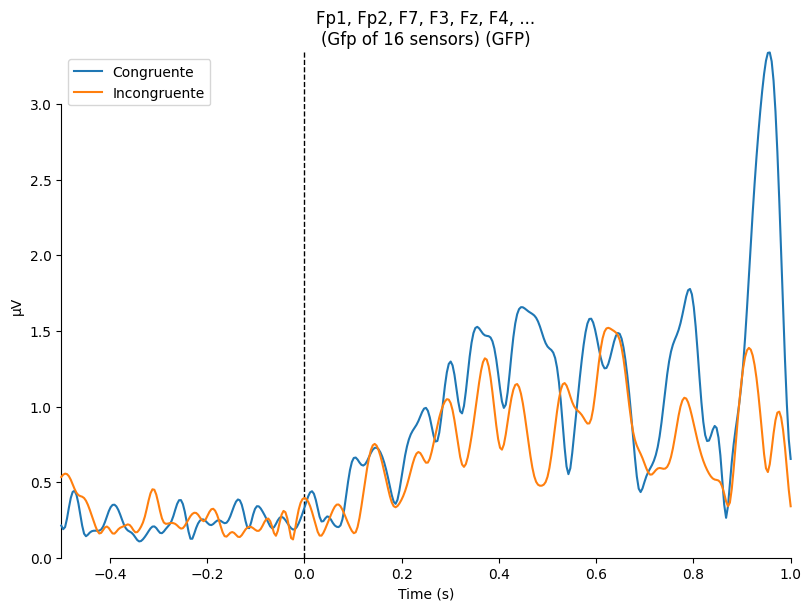

[<Figure size 800x600 with 1 Axes>]

In [ ]:

cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picksOI = ['O1','P7','P3']
mne.viz.plot_compare_evokeds(evokeds, picks=picks)

combining channels using "mean"
combining channels using "mean"


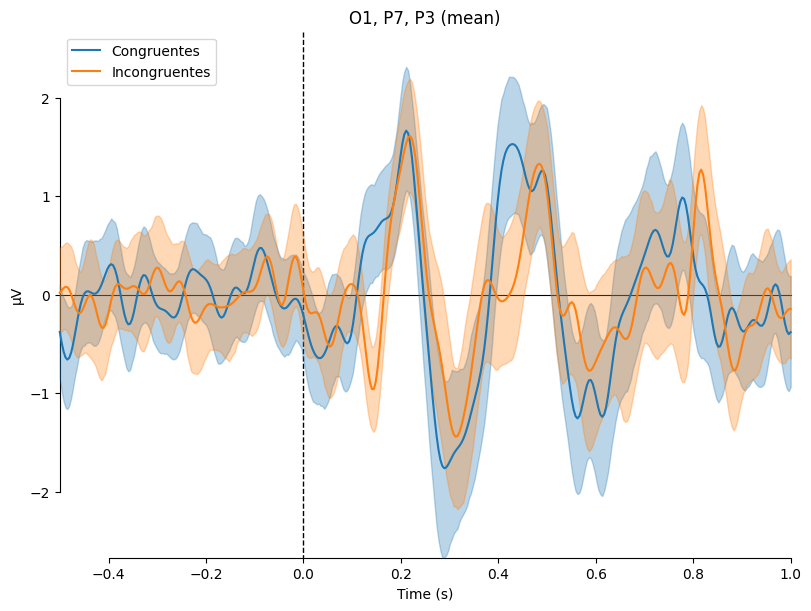

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes=list(epochscond1.iter_evoked()),
    Incongruentes=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksOI)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


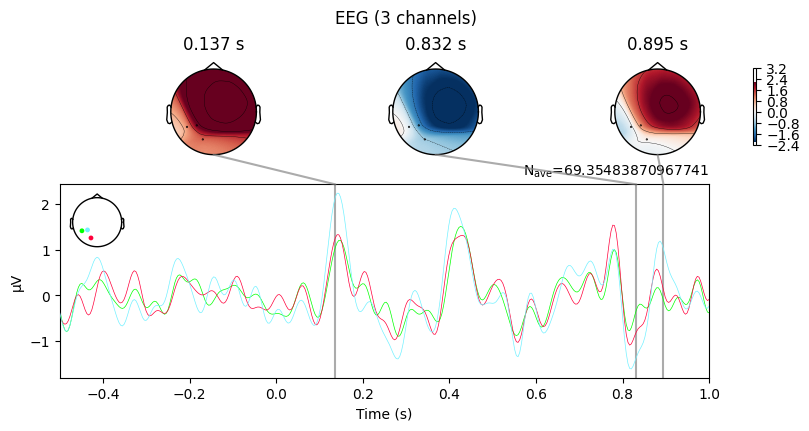

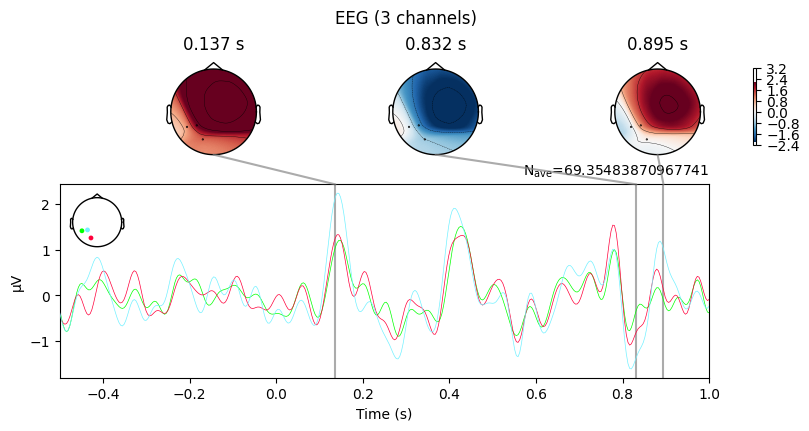

In [ ]:
### Resta de canales
epochscond1_picks = epochscond1_avg.pick_channels(['O1','P7','P3'])
epochscond2_picks = epochscond2_avg.pick_channels(['O1','P7','P3'])

aud_minus_vis = mne.combine_evoked([epochscond1_avg, epochscond2_avg], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparación condiciones zona Occipital I con Pz


In [ ]:
#Tenemos que volver a resetear

epochscond1 = epochs["Congruent"]
epochscond1_avg = epochscond1.average( )

epochscond2 = epochs["Incongruent"]
epochscond2_avg = epochscond2.average( )

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


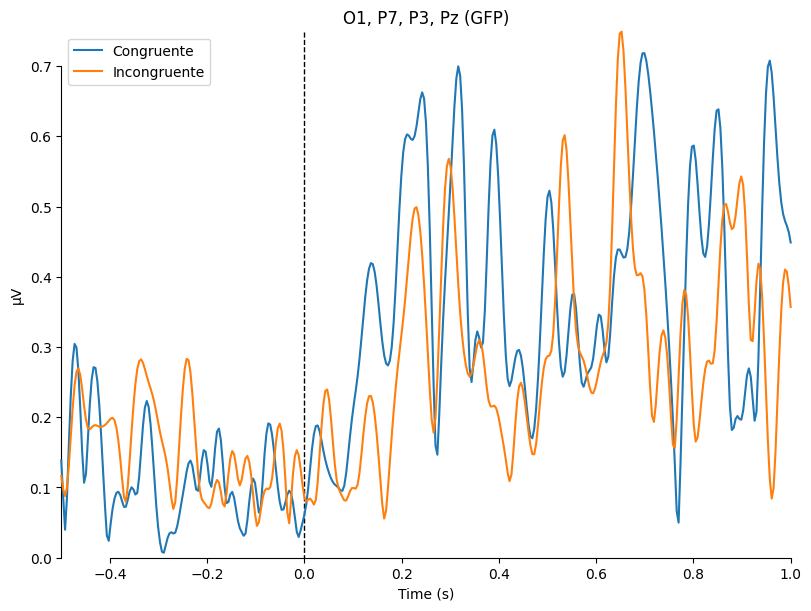

[<Figure size 800x600 with 1 Axes>]

In [ ]:

cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picksOI = ['O1','P7','P3','Pz']
mne.viz.plot_compare_evokeds(evokeds, picks=picksOI)

combining channels using "mean"
combining channels using "mean"


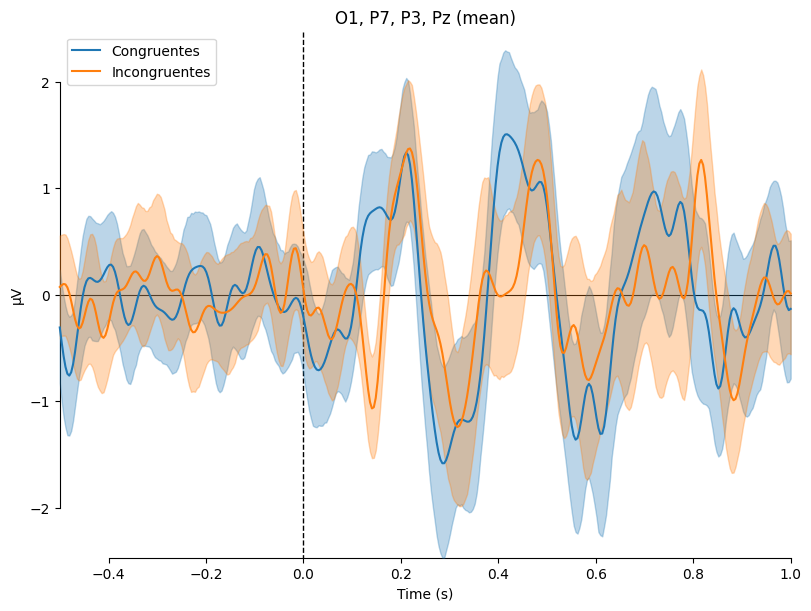

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes=list(epochscond1.iter_evoked()),
    Incongruentes=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksOI)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


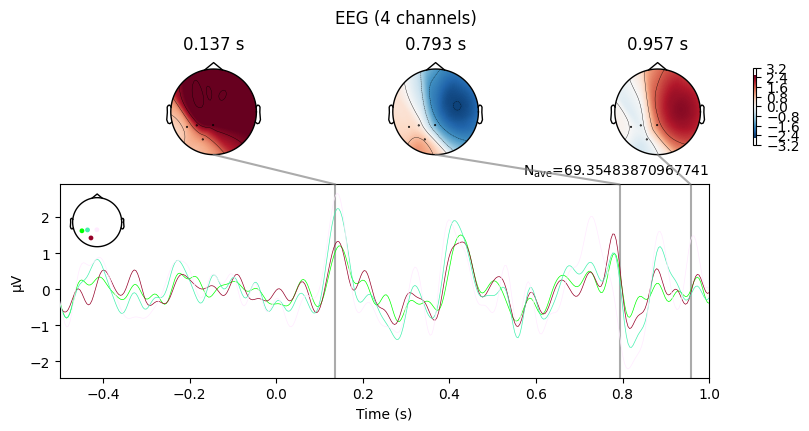

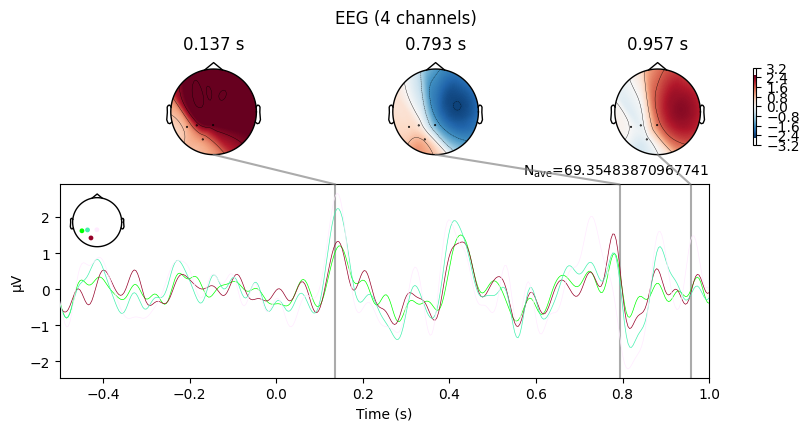

In [ ]:
epochscond1_picks = epochscond1_avg.pick_channels(['O1','P7','P3','Pz'])
epochscond2_picks = epochscond2_avg.pick_channels(['O1','P7','P3','Pz'])

aud_minus_vis = mne.combine_evoked([epochscond1_avg, epochscond2_avg], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparación condiciones zona Occipital I con C3


In [ ]:
#Reseteamos por última vez en la parte izquierda

epochscond1 = epochs["Congruent"]
epochscond1_avg = epochscond1.average( )

epochscond2 = epochs["Incongruent"]
epochscond2_avg = epochscond2.average( )

More than 6 channels, truncating title ...
combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


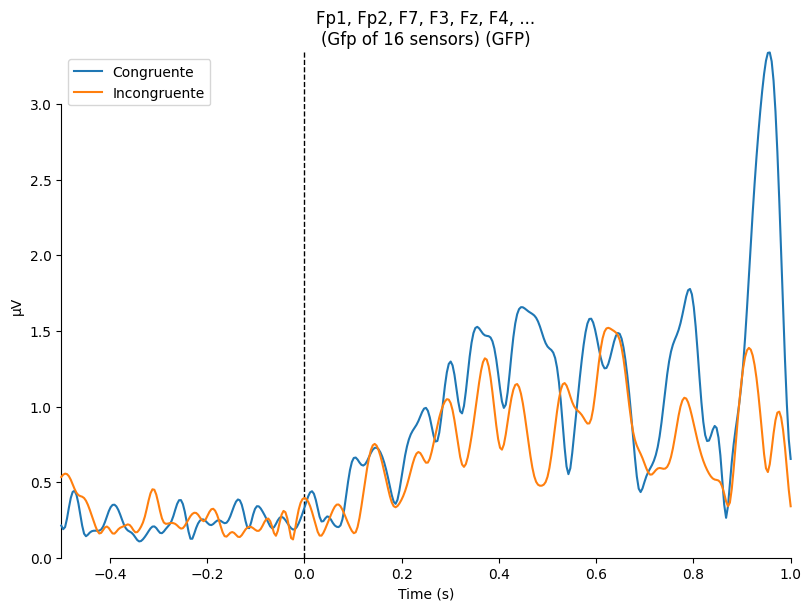

[<Figure size 800x600 with 1 Axes>]

In [ ]:

cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picksOI = ['O1','P7','P3','C3']
mne.viz.plot_compare_evokeds(evokeds, picks=picks)

combining channels using "mean"
combining channels using "mean"


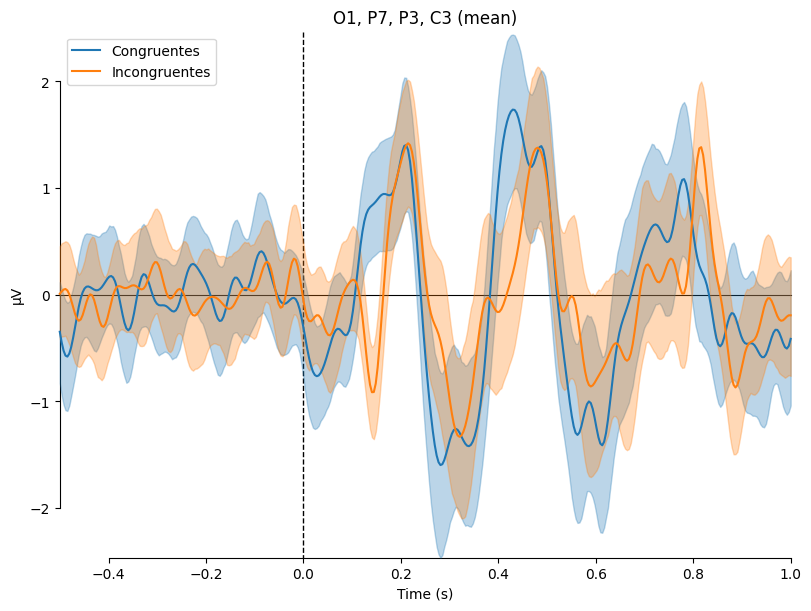

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes=list(epochscond1.iter_evoked()),
    Incongruentes=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksOI)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


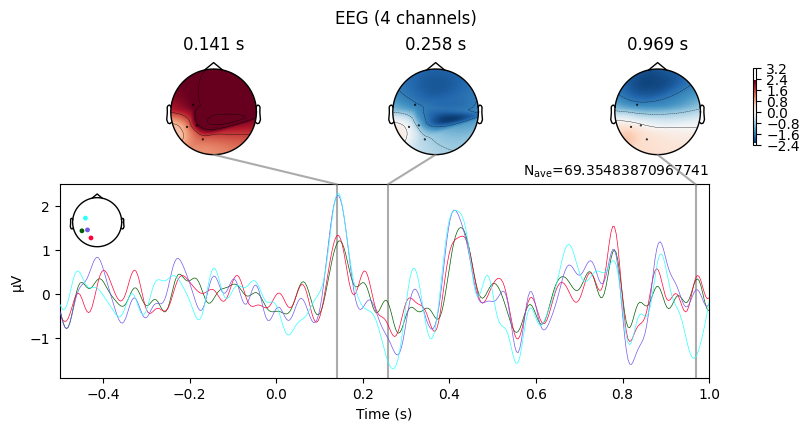

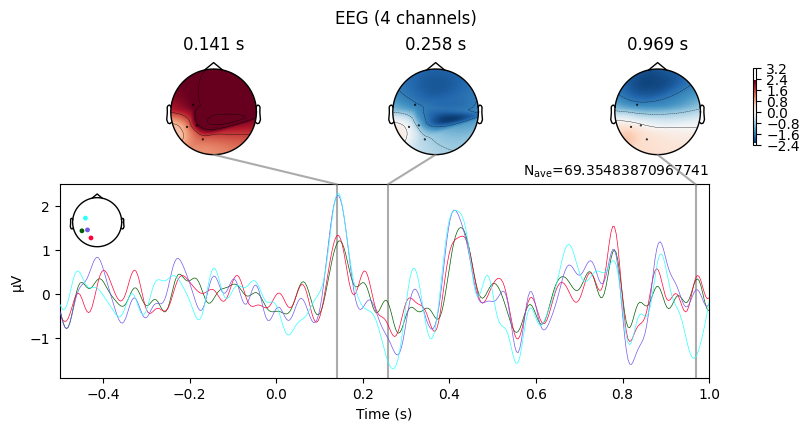

In [ ]:
epochscond1_picks = epochscond1_avg.pick_channels(['O1','P7','P3','C3'])
epochscond2_picks = epochscond2_avg.pick_channels(['O1','P7','P3','C3'])

aud_minus_vis = mne.combine_evoked([epochscond1_avg, epochscond2_avg], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparación condiciones zona Occipital D (Occipucio)

In [ ]:
#Reseteamos para la parte trasera derecha

epochscond1 = epochs["Congruent"]
epochscond1_avg = epochscond1.average( )

epochscond2 = epochs["Incongruent"]
epochscond2_avg = epochscond2.average( )

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


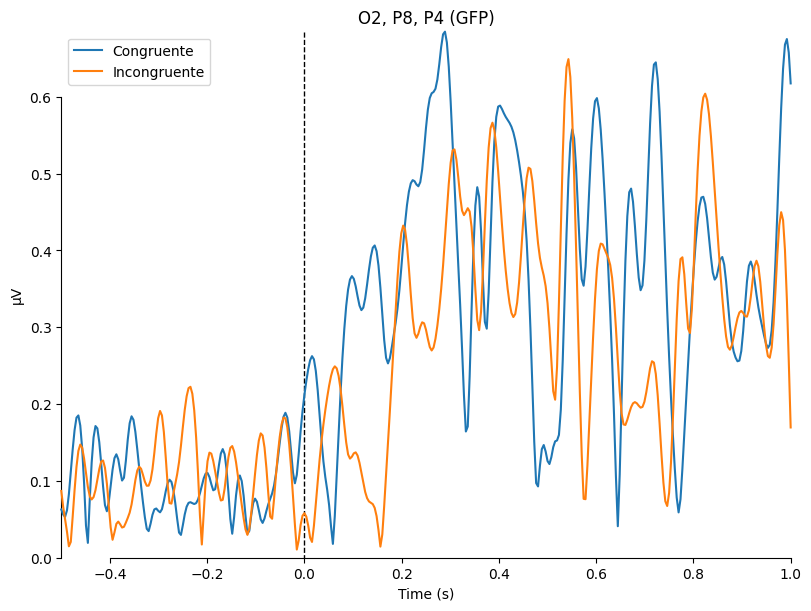

[<Figure size 800x600 with 1 Axes>]

In [ ]:

cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picksOD = ['O2','P8','P4']
mne.viz.plot_compare_evokeds(evokeds, picks=picksOD)

combining channels using "mean"
combining channels using "mean"


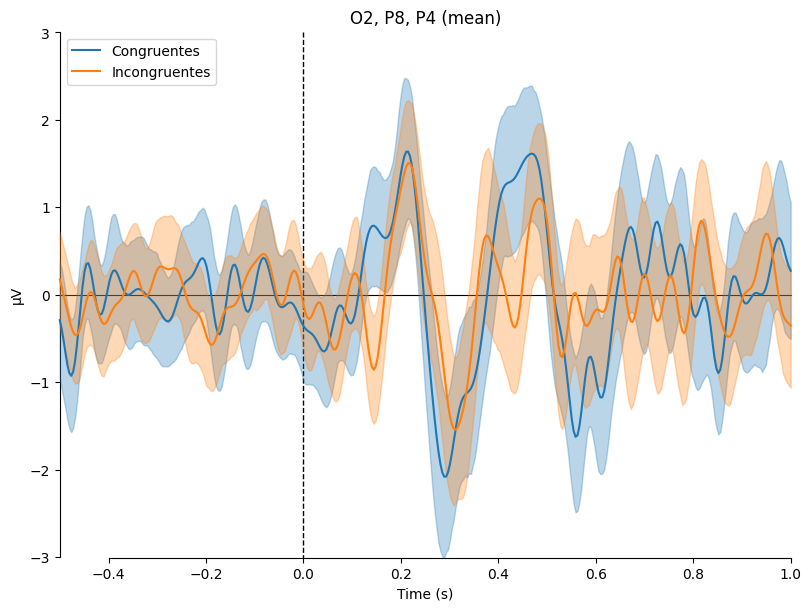

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes=list(epochscond1.iter_evoked()),
    Incongruentes=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksOD)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


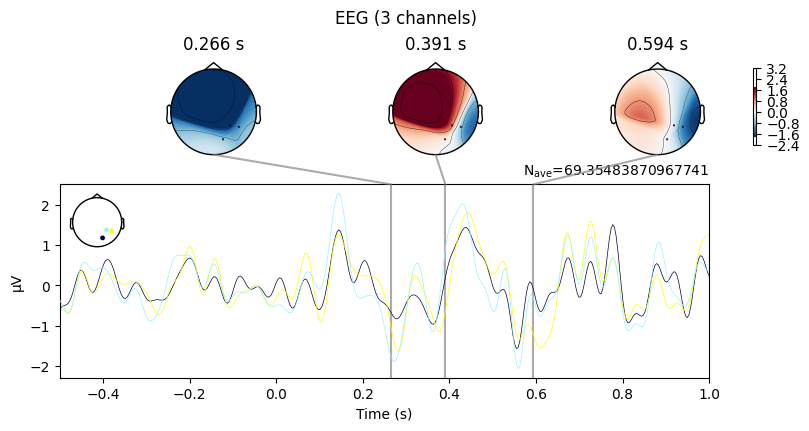

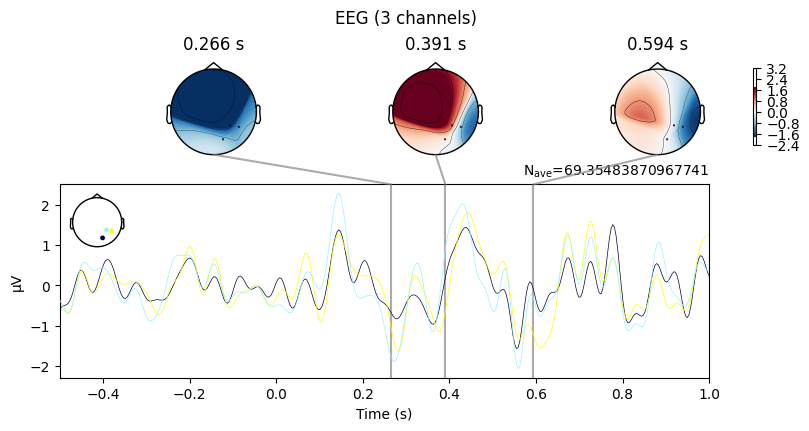

In [ ]:
### Resta de canales

epochscond1_picks = epochscond1_avg.pick_channels(['O2','P8','P4'])
epochscond2_picks = epochscond2_avg.pick_channels(['O2','P8','P4'])

aud_minus_vis = mne.combine_evoked([epochscond1_avg, epochscond2_avg], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparación condiciones zona Occipital D con Pz

In [ ]:
#Reseteamos por penúltima vez para incluir Pz

epochscond1 = epochs["Congruent"]
epochscond1_avg = epochscond1.average( )

epochscond2 = epochs["Incongruent"]
epochscond2_avg = epochscond2.average( )

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


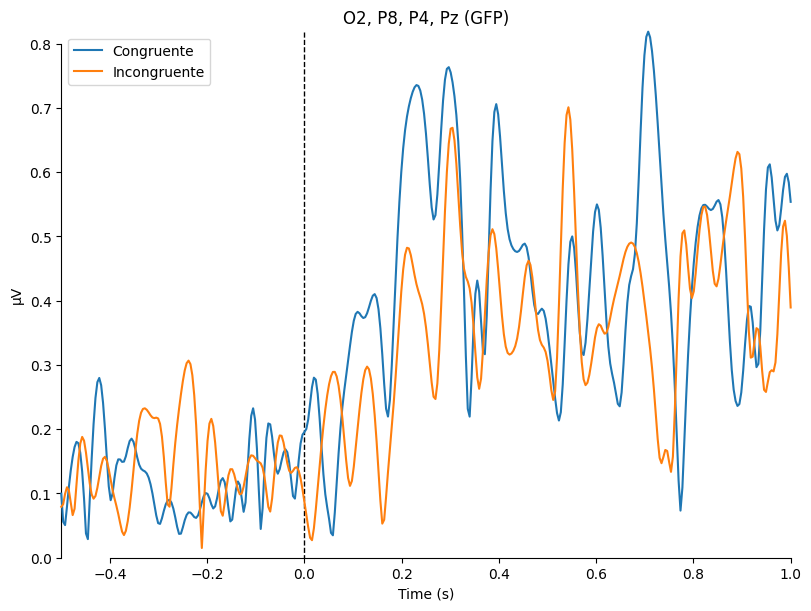

[<Figure size 800x600 with 1 Axes>]

In [ ]:

cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picksOD = ['O2','P8','P4','Pz']
mne.viz.plot_compare_evokeds(evokeds, picks=picksOD)

combining channels using "mean"
combining channels using "mean"


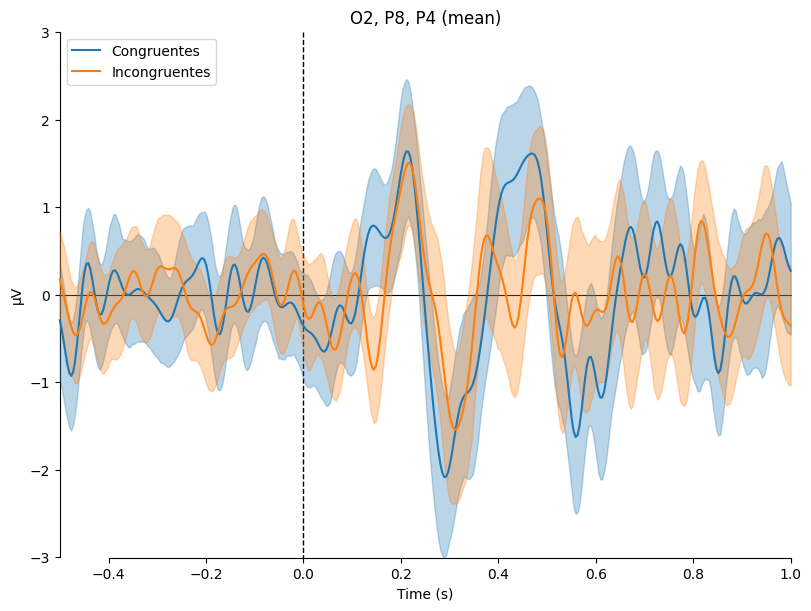

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes=list(epochscond1.iter_evoked()),
    Incongruentes=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksOD)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


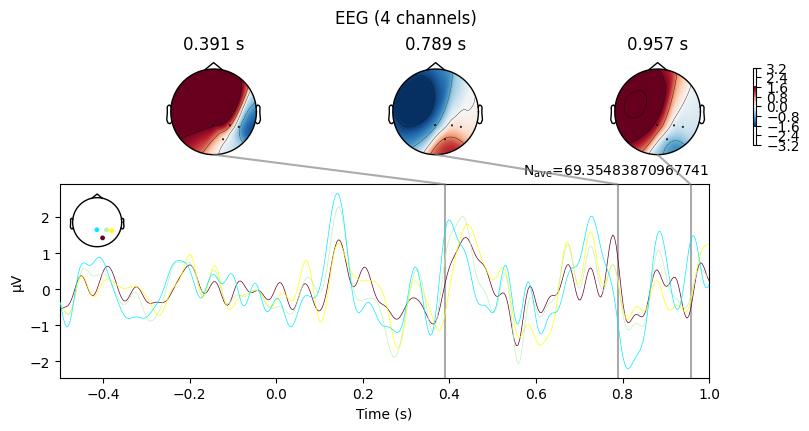

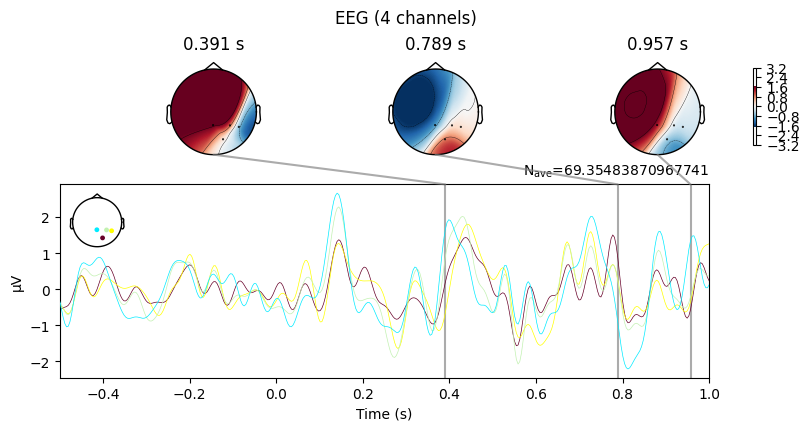

In [ ]:
### Resta de canales

epochscond1_picks = epochscond1_avg.pick_channels(['O2','P8','P4','Pz'])
epochscond2_picks = epochscond2_avg.pick_channels(['O2','P8','P4','Pz'])

aud_minus_vis = mne.combine_evoked([epochscond1_avg, epochscond2_avg], weights=[1, -1])
aud_minus_vis.plot_joint()

Comparación condiciones zona Occipital D con C4

In [ ]:
#Reseteamos por última vez
epochscond1 = epochs["Congruent"]
epochscond1_avg = epochscond1.average( )

epochscond2 = epochs["Incongruent"]
epochscond2_avg = epochscond2.average( )

combining channels using GFP (eeg channels)
combining channels using GFP (eeg channels)


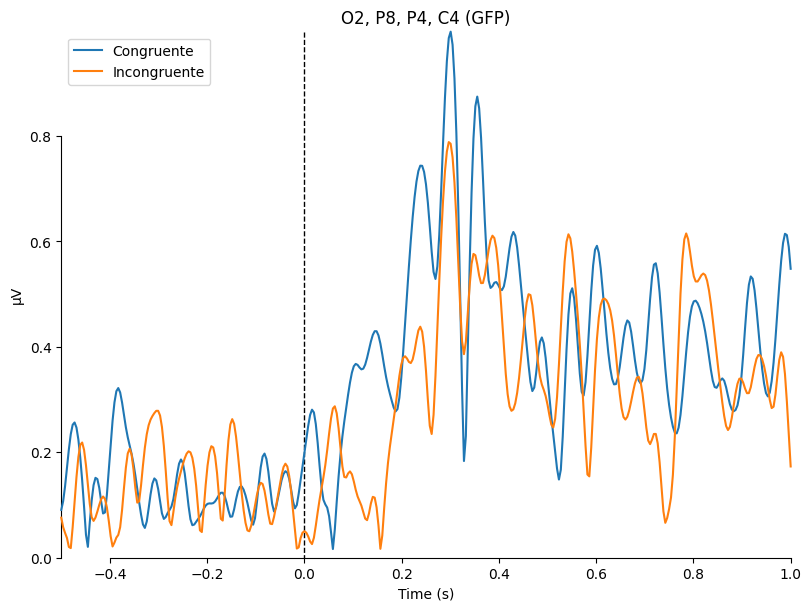

[<Figure size 800x600 with 1 Axes>]

In [ ]:

cong = epochscond1_avg
incong = epochscond2_avg
evokeds = dict(Congruente=cong, Incongruente=incong)
picksOD = ['O2','P8','P4','C4']
mne.viz.plot_compare_evokeds(evokeds, picks=picksOD)

combining channels using "mean"
combining channels using "mean"


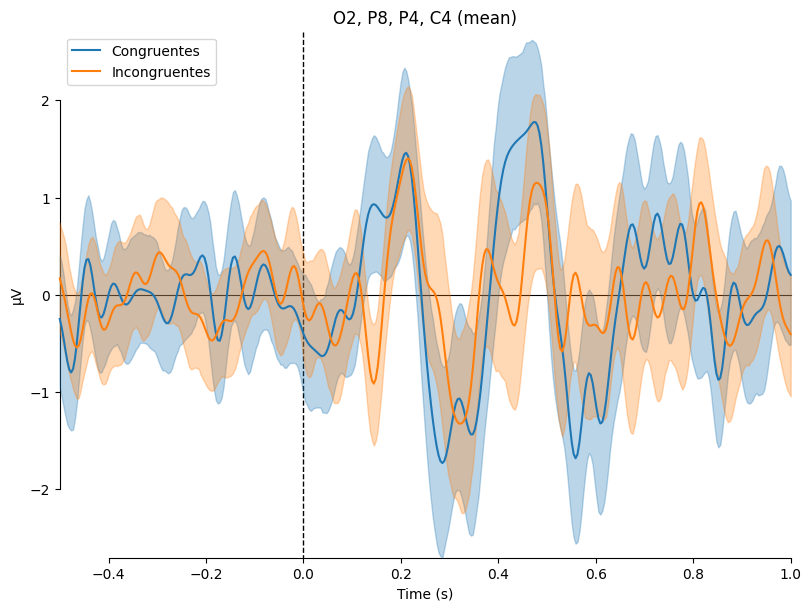

[<Figure size 800x600 with 1 Axes>]

In [ ]:
###Con intervalo de confianza
evokedsIter = dict(
    Congruentes=list(epochscond1.iter_evoked()),
    Incongruentes=list(epochscond2.iter_evoked()),
)
mne.viz.plot_compare_evokeds(evokedsIter, combine="mean", picks=picksOD)

NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
NOTE: pick_channels() is a legacy function. New code should use inst.pick(...).
No projector specified for this dataset. Please consider the method self.add_proj.


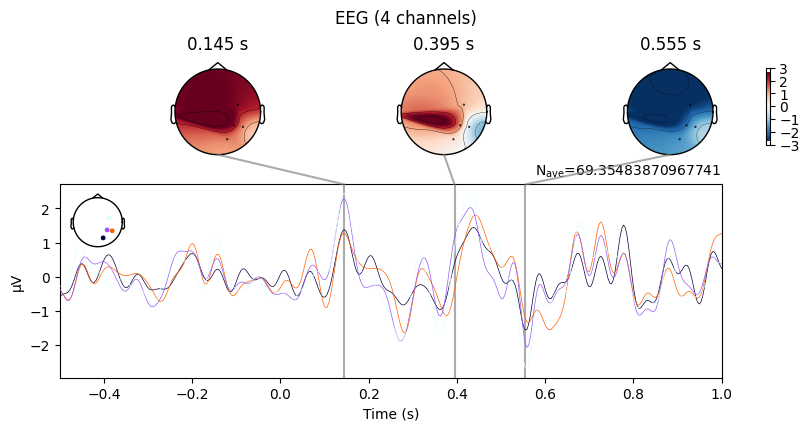

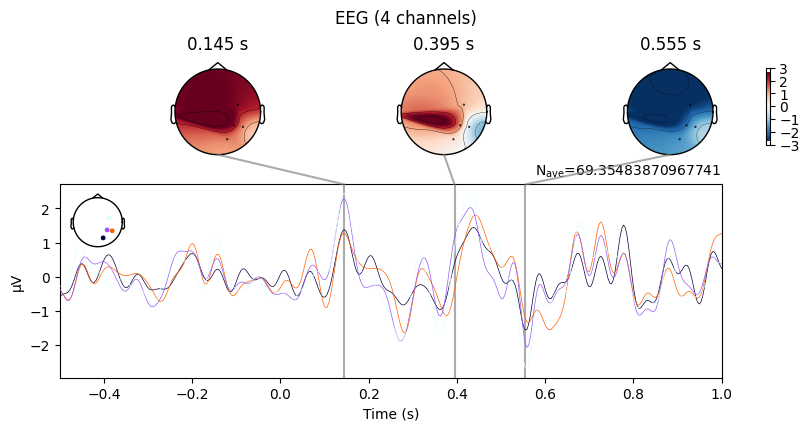

In [ ]:
### Resta de canales

epochscond1_picks = epochscond1_avg.pick_channels(['O2','P8','P4','C4'])
epochscond2_picks = epochscond2_avg.pick_channels(['O2','P8','P4','C4'])

aud_minus_vis = mne.combine_evoked([epochscond1_avg, epochscond2_avg], weights=[1, -1])
aud_minus_vis.plot_joint()

Sin duda alguna estas gráficas proporcionan información sumamente relevante para nuestro análisis, la segmentación de nodos nos permiten tomar diferentes pruebas imperantes para este experimento.